In [ ]:
pip install bio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.0/281.0 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 49.4 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
from Bio.SeqUtils.ProtParam import ProteinAnalysis
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import os
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers, models
from collections import Counter

#Sequence Data Preprocessing

In [ ]:
# Load mic_data.csv
mic_data = pd.read_csv('/content/drive/MyDrive/data 2/mic_data.csv')

# Load Veltri datasets
veltri_positive = pd.read_csv('/content/drive/MyDrive/data 2/veltri_positive.csv')
veltri_negative = pd.read_csv('/content/drive/MyDrive/data 2/veltri_negative.csv')

# Load unlabelled datasets
unlabelled_positive = pd.read_csv('/content/drive/MyDrive/data 2/unlabelled_positive.csv')
unlabelled_negative = pd.read_csv('/content/drive/MyDrive/data 2/unlabelled_negative.csv')

In [ ]:
# Rename 'sequence' to 'Sequence' in mic_data
mic_data.rename(columns={'sequence': 'Sequence'}, inplace=True)

# Ensure all DataFrames have 'Sequence' column
veltri_positive.rename(columns={'Sequence': 'Sequence'}, inplace=True)
veltri_negative.rename(columns={'Sequence': 'Sequence'}, inplace=True)
unlabelled_positive.rename(columns={'Sequence': 'Sequence'}, inplace=True)
unlabelled_negative.rename(columns={'Sequence': 'Sequence'}, inplace=True)

In [ ]:
# Combine positive datasets
positive_data = pd.concat([
    mic_data[['Sequence']],
    veltri_positive[['Sequence']],
    unlabelled_positive[['Sequence']]
], ignore_index=True)

# Assign label 1 to positive samples
positive_data['Label'] = 1

In [ ]:
# Combine negative datasets
negative_data = pd.concat([
    veltri_negative[['Sequence']],
    unlabelled_negative[['Sequence']]
], ignore_index=True)

# Assign label 0 to negative samples
negative_data['Label'] = 0

In [ ]:
# Combine positive and negative data
all_data = pd.concat([positive_data, negative_data], ignore_index=True)

In [ ]:
# Remove duplicates
all_data.drop_duplicates(subset='Sequence', inplace=True)

# Define standard amino acids
standard_aas = 'ACDEFGHIKLMNPQRSTVWY'

# Function to check if a sequence contains only standard amino acids
def is_valid_sequence(seq):
    return all(aa in standard_aas for aa in seq)

# Remove sequences with non-standard amino acids
all_data['Valid'] = all_data['Sequence'].apply(is_valid_sequence)
all_data = all_data[all_data['Valid']].drop(columns=['Valid'])

# Remove sequences with missing values
all_data.dropna(subset=['Sequence'], inplace=True)

In [ ]:
from sklearn.utils import resample

# Separate majority and minority classes
df_majority = all_data[all_data.Label == 0]
df_minority = all_data[all_data.Label == 1]

# Downsample majority class
df_majority_downsampled = resample(
    df_majority,
    replace=False,    # sample without replacement
    n_samples=len(df_minority),  # match minority class size
    random_state=42   # reproducible results
)

# Combine minority class with downsampled majority class
balanced_data = pd.concat([df_majority_downsampled, df_minority])

# Shuffle the data
balanced_data = balanced_data.sample(frac=1, random_state=42).reset_index(drop=True)

In [ ]:
# Function to compute amino acid composition
def aa_composition(seq):
    composition = Counter(seq)
    total = sum(composition.values())
    return {aa: composition.get(aa, 0) / total for aa in standard_aas}

# Apply the function to compute features
aa_comp_features = balanced_data['Sequence'].apply(aa_composition)
aa_comp_df = pd.DataFrame(aa_comp_features.tolist())

In [ ]:
# Function to compute physicochemical properties
def compute_physicochemical_properties(seq):
    analysis = ProteinAnalysis(seq)
    features = {}
    features['Length'] = len(seq)
    features['MW'] = analysis.molecular_weight()
    features['Isoelectric_Point'] = analysis.isoelectric_point()
    features['Aromaticity'] = analysis.aromaticity()
    features['Instability_Index'] = analysis.instability_index()
    features['Gravy'] = analysis.gravy()
    return features

# Apply the function to compute features
physico_features = balanced_data['Sequence'].apply(compute_physicochemical_properties)
physico_df = pd.DataFrame(physico_features.tolist())

In [ ]:
# Combine all features into a single DataFrame
sequence_features = pd.concat([aa_comp_df, physico_df], axis=1)
sequence_features['Label'] = balanced_data['Label'].values

In [ ]:
sequence_features.head()

,A,C,D,E,F,G,H,I,K,L,...,V,W,Y,Length,MW,Isoelectric_Point,Aromaticity,Instability_Index,Gravy,Label
0,0.042683,0.030488,0.060976,0.085366,0.012195,0.048780,0.006098,0.060976,0.103659,0.109756,...,0.042683,0.024390,0.030488,164,18897.4864,8.764622,0.067073,44.730488,-0.717073,0
1,0.022472,0.022472,0.078652,0.089888,0.033708,0.033708,0.022472,0.101124,0.078652,0.101124,...,0.101124,0.011236,0.044944,89,10640.3036,6.724530,0.089888,28.437079,-0.240449,1
2,0.136364,0.015152,0.015152,0.000000,0.075758,0.045455,0.015152,0.106061,0.151515,0.075758,...,0.090909,0.000000,0.000000,66,7128.6494,10.893755,0.075758,32.080303,0.487879,1
3,0.121387,0.011561,0.046243,0.069364,0.046243,0.080925,0.017341,0.057803,0.034682,0.098266,...,0.057803,0.023121,0.023121,173,19167.8463,7.807589,0.092486,37.672312,-0.019653,0
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,0.000000,...,0.000000,0.000000,0.200000,5,653.7277,9.992164,0.200000,-25.820000,-2.240000,1


In [ ]:
sequence_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45354 entries, 0 to 45353
Data columns (total 27 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   A                  45354 non-null  float64
 1   C                  45354 non-null  float64
 2   D                  45354 non-null  float64
 3   E                  45354 non-null  float64
 4   F                  45354 non-null  float64
 5   G                  45354 non-null  float64
 6   H                  45354 non-null  float64
 7   I                  45354 non-null  float64
 8   K                  45354 non-null  float64
 9   L                  45354 non-null  float64
 10  M                  45354 non-null  float64
 11  N                  45354 non-null  float64
 12  P                  45354 non-null  float64
 13  Q                  45354 non-null  float64
 14  R                  45354 non-null  float64
 15  S                  45354 non-null  float64
 16  T                  453

#Data Visualization

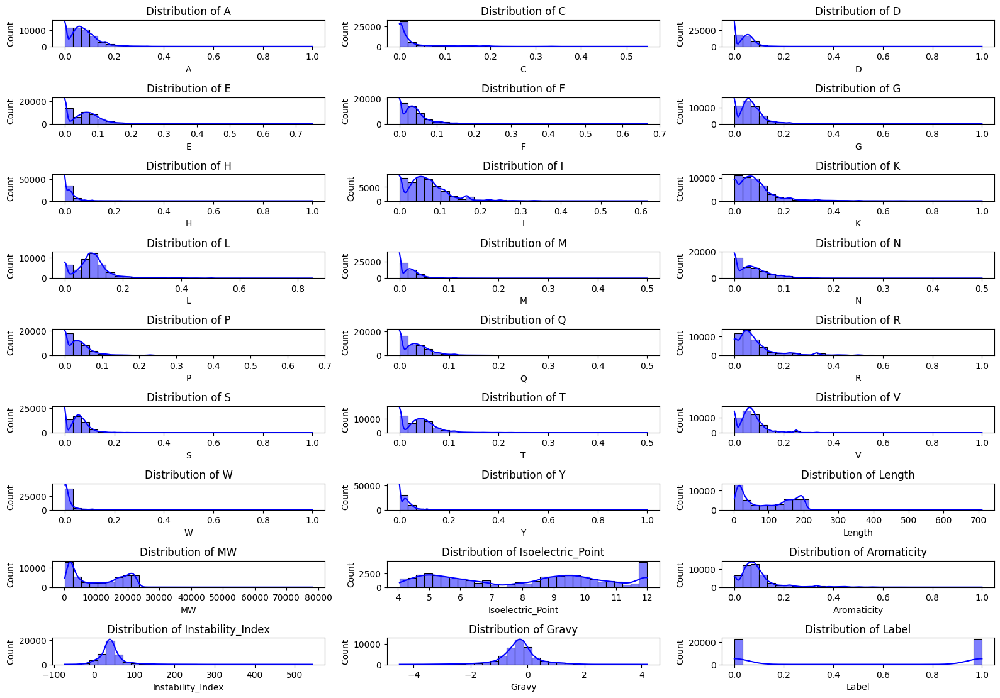

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Load the dataset
data = sequence_features

# Distribution of numerical features
def plot_distributions(data):
    numeric_features = data.select_dtypes(include=['float64', 'int64']).columns
    plt.figure(figsize=(16, 12))
    for i, col in enumerate(numeric_features, 1):
        plt.subplot((len(numeric_features) // 3) + 1, 3, i)
        sns.histplot(data[col], kde=True, bins=30, color='blue')
        plt.title(f'Distribution of {col}')
    plt.tight_layout()
    plt.show()


# Distribution of features
plot_distributions(data)


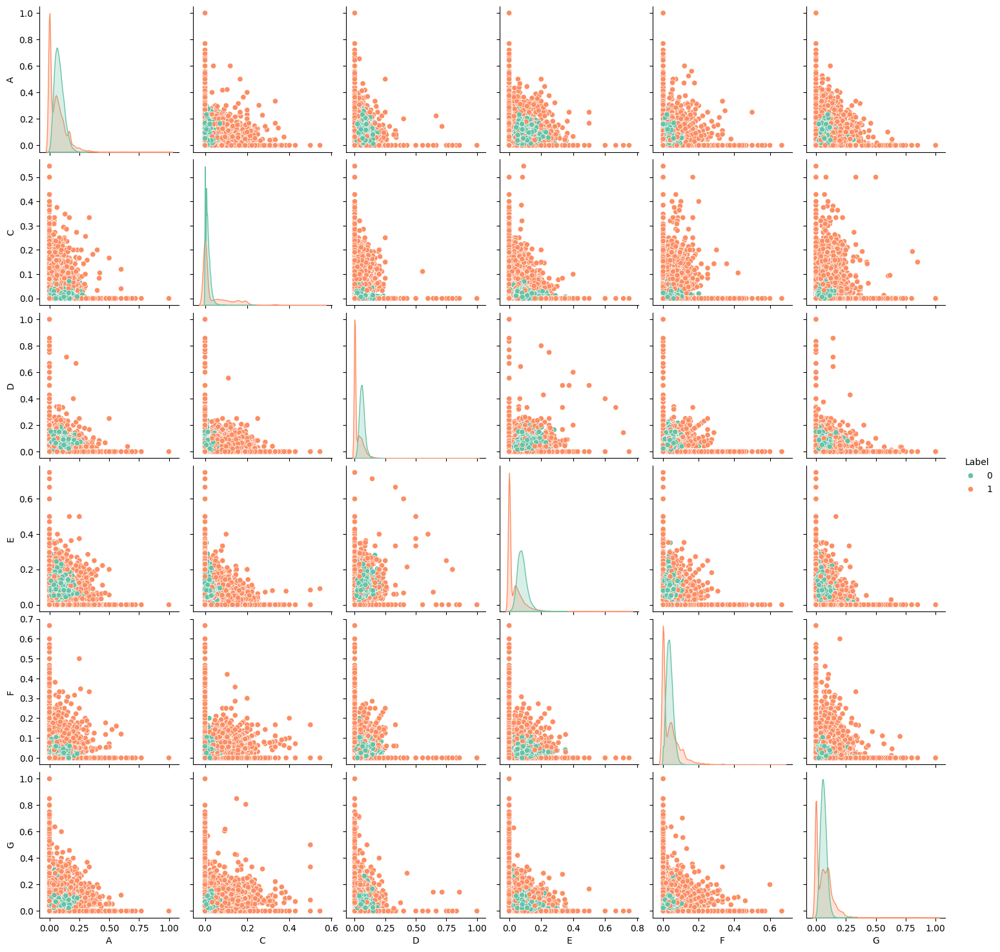

In [ ]:
# Pairplot for selected features
def plot_pairplot(data, features, target):
    sns.pairplot(data[features + [target]], hue=target, palette='Set2')
    plt.show()


# Pairplot for selected features
selected_features = ['A', 'C', 'D', 'E', 'F', 'G']
plot_pairplot(data, selected_features, target='Label')


These show the pairwise relationships between the selected amino acid compositions (e.g., A vs. C, C vs. D, etc.).

Each point represents a sequence in the dataset.

These scatter plots can reveal the Correlations or patterns between amino acid compositions.


These are histograms (or kernel density plots) of each amino acid composition for the two classes.
Each plot represents the distribution of one amino acid composition (A, C, D, etc.).
These plots help identify if certain amino acids are more prevalent in one class than the other:
For example, an overlap between orange and green curves indicates similarity between the classes for that feature.
If the curves are separated, it suggests that the feature discriminates well between the two classes.



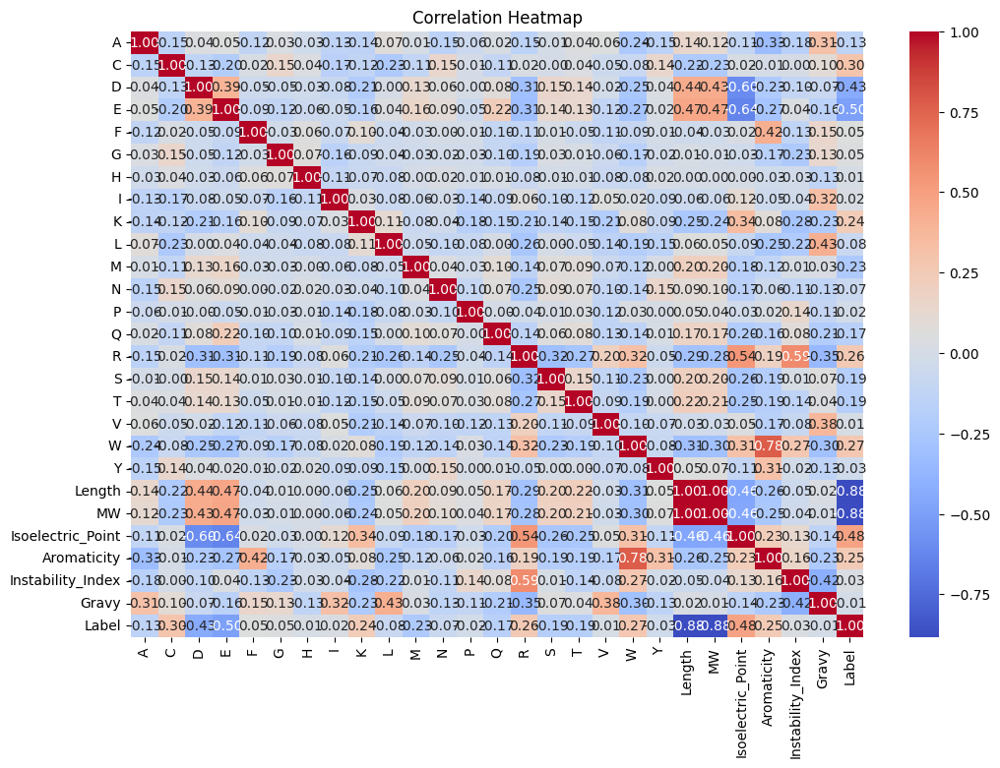

In [ ]:
# Correlation heatmap
def plot_correlation_heatmap(data):
    plt.figure(figsize=(12, 8))
    corr_matrix = data.corr()
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
    plt.title('Correlation Heatmap')
    plt.show()

# Correlation heatmap
plot_correlation_heatmap(data)

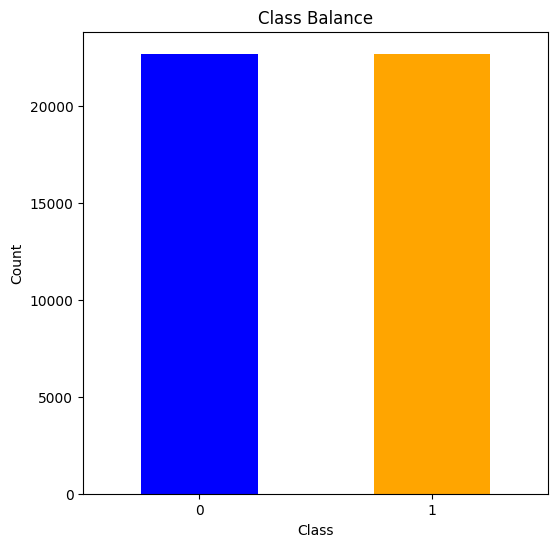

In [ ]:
# Class balance
def plot_class_balance(data, target):
    class_counts = data[target].value_counts()
    plt.figure(figsize=(6, 6))
    class_counts.plot(kind='bar', color=['blue', 'orange'])
    plt.title('Class Balance')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.show()


# Class balance
plot_class_balance(data, target='Label')

<ipython-input-21-6fddf8789bb9>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=target, y=col, data=data, palette='Set2')
<ipython-input-21-6fddf8789bb9>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=target, y=col, data=data, palette='Set2')
<ipython-input-21-6fddf8789bb9>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=target, y=col, data=data, palette='Set2')
<ipython-input-21-6fddf8789bb9>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue`

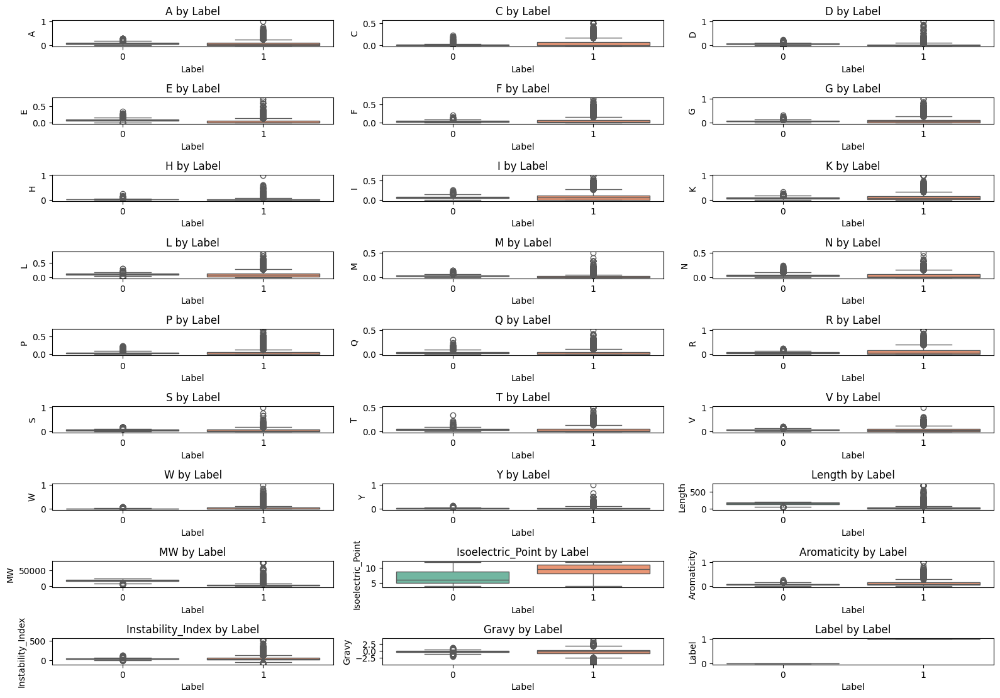

In [ ]:
# Boxplots for features against target
def plot_boxplots(data, target):
    numeric_features = data.select_dtypes(include=['float64', 'int64']).columns
    plt.figure(figsize=(16, 12))
    for i, col in enumerate(numeric_features, 1):
        plt.subplot((len(numeric_features) // 3) + 1, 3, i)
        sns.boxplot(x=target, y=col, data=data, palette='Set2')
        plt.title(f'{col} by {target}')
    plt.tight_layout()
    plt.show()


# Boxplots
plot_boxplots(data, target='Label')

**Amino Acid Composition:**

Some amino acids (e.g., A, D, E) show subtle differences between Label=0 and Label=1.

Features like H, W, Y may have less variability or discrimination, as their boxplots are very similar for both labels.

**Physicochemical Properties:**

Isoelectric Point: Clear separation between Label=0 and Label=1, suggesting it is a strong discriminator.

Instability Index: Some degree of separation, with differences in median and spread.

GRAVY and Length: Show some class-specific trends but have more overlap.


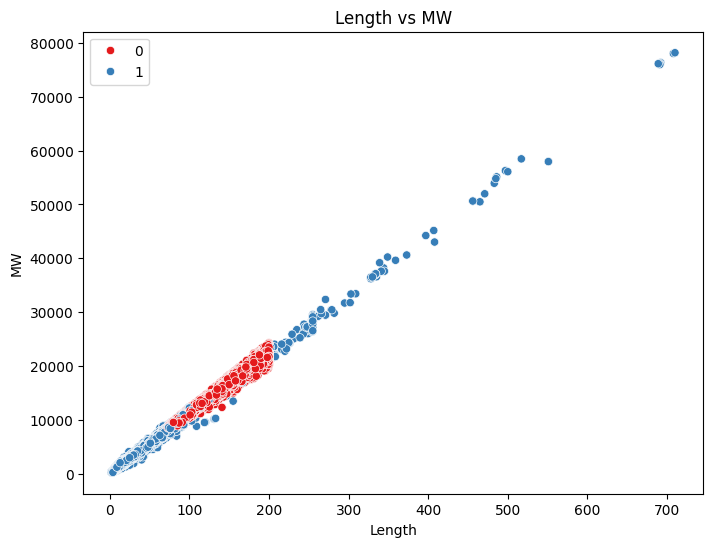

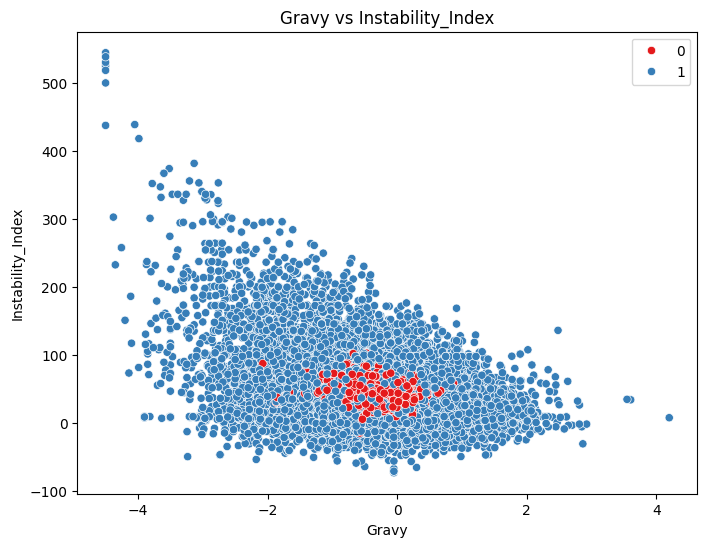

In [ ]:
# Scatter plots for specific features
def plot_scatter_features(data, x_feature, y_feature, target):
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=data, x=x_feature, y=y_feature, hue=target, palette='Set1')
    plt.title(f'{x_feature} vs {y_feature}')
    plt.xlabel(x_feature)
    plt.ylabel(y_feature)
    plt.legend()
    plt.show()



# Scatter plots
plot_scatter_features(data, x_feature='Length', y_feature='MW', target='Label')
plot_scatter_features(data, x_feature='Gravy', y_feature='Instability_Index', target='Label')

<ipython-input-23-36b2f26fed0c>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=data, palette='muted')


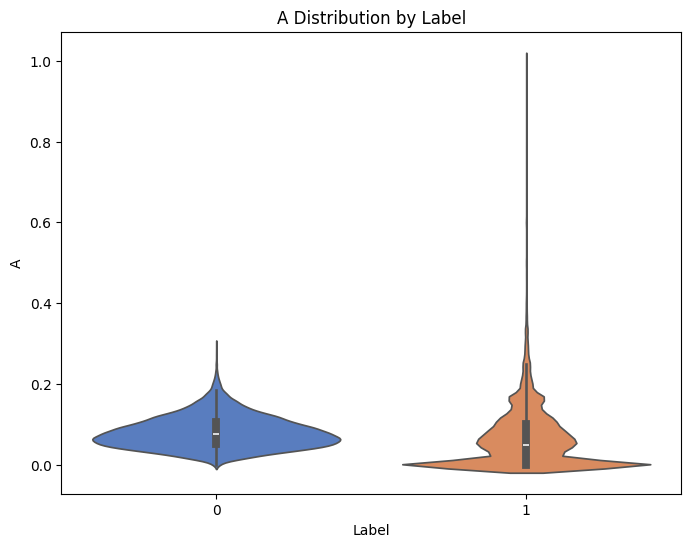

<ipython-input-23-36b2f26fed0c>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=data, palette='muted')


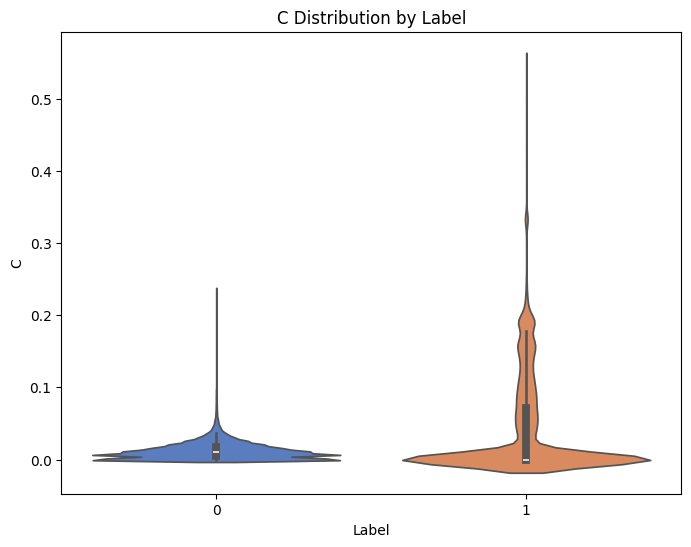

<ipython-input-23-36b2f26fed0c>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=data, palette='muted')


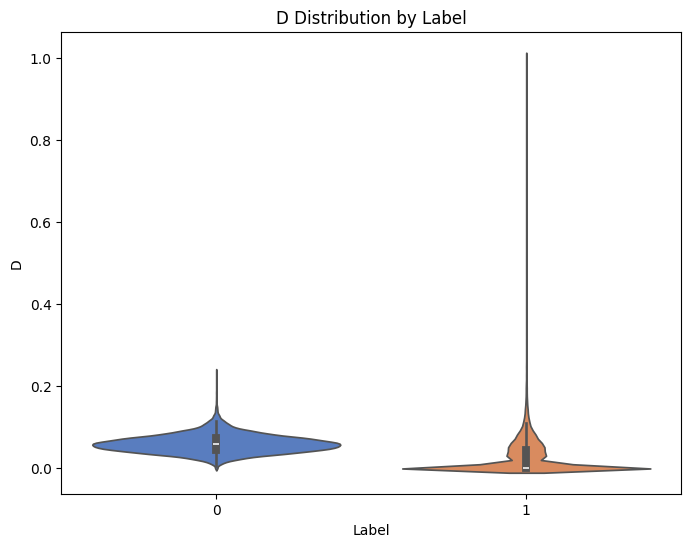

<ipython-input-23-36b2f26fed0c>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=data, palette='muted')


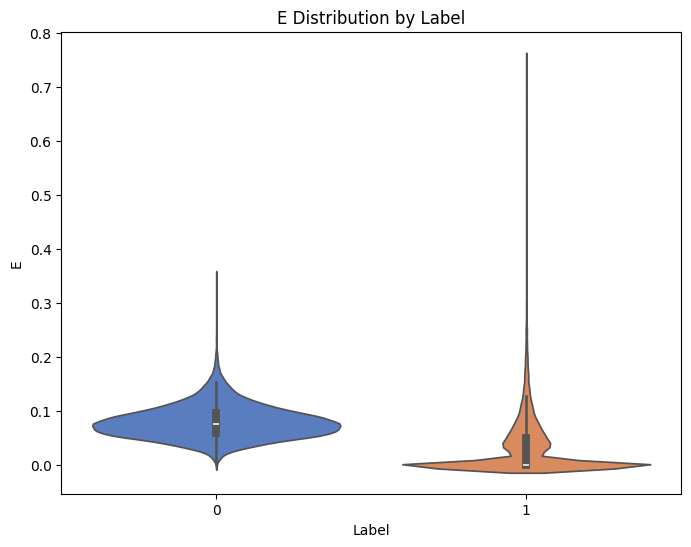

<ipython-input-23-36b2f26fed0c>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=data, palette='muted')


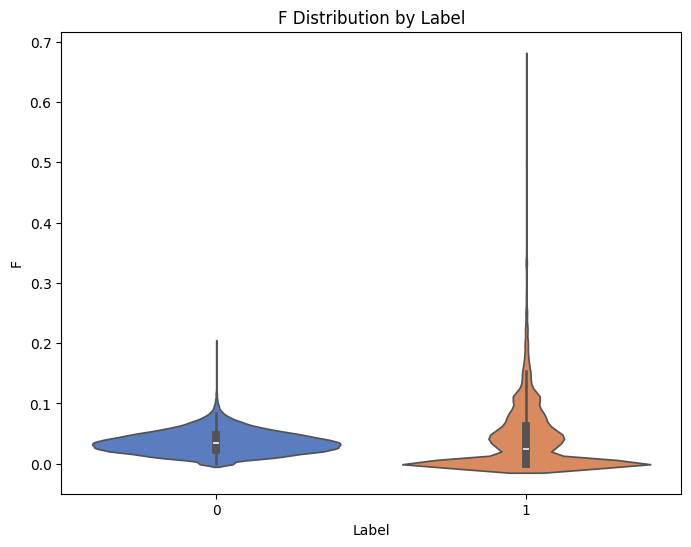

<ipython-input-23-36b2f26fed0c>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=target, y=feature, data=data, palette='muted')


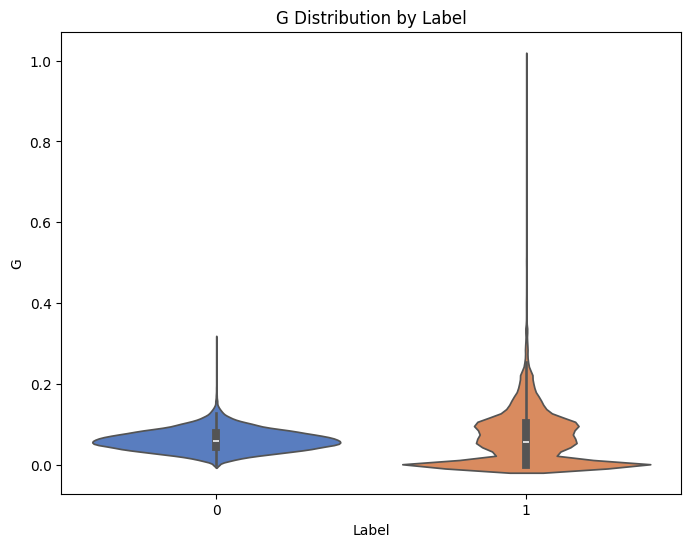

In [ ]:
# Violin plots for features
def plot_violin(data, features, target):
    for feature in features:
        plt.figure(figsize=(8, 6))
        sns.violinplot(x=target, y=feature, data=data, palette='muted')
        plt.title(f'{feature} Distribution by {target}')
        plt.show()

# Violin plots for selected features
plot_violin(data, features=selected_features, target='Label')

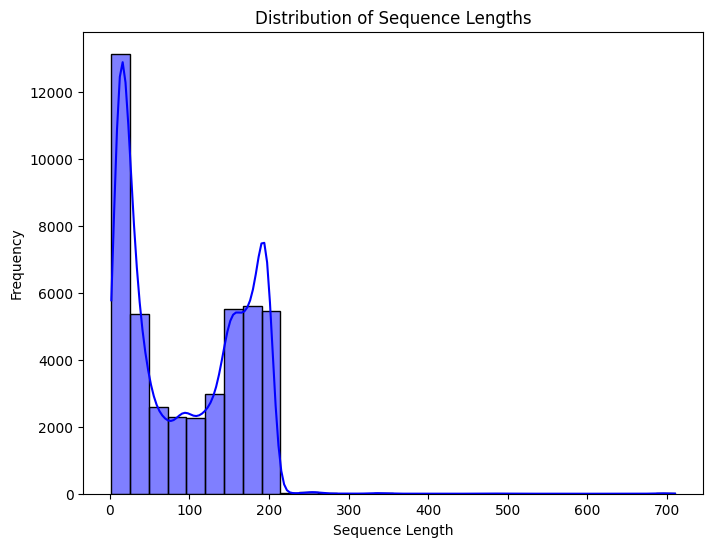

In [ ]:
# Plot distribution of sequence lengths
plt.figure(figsize=(8, 6))
sns.histplot(data['Length'], bins=30, kde=True, color='blue')
plt.title('Distribution of Sequence Lengths')
plt.xlabel('Sequence Length')
plt.ylabel('Frequency')
plt.show()


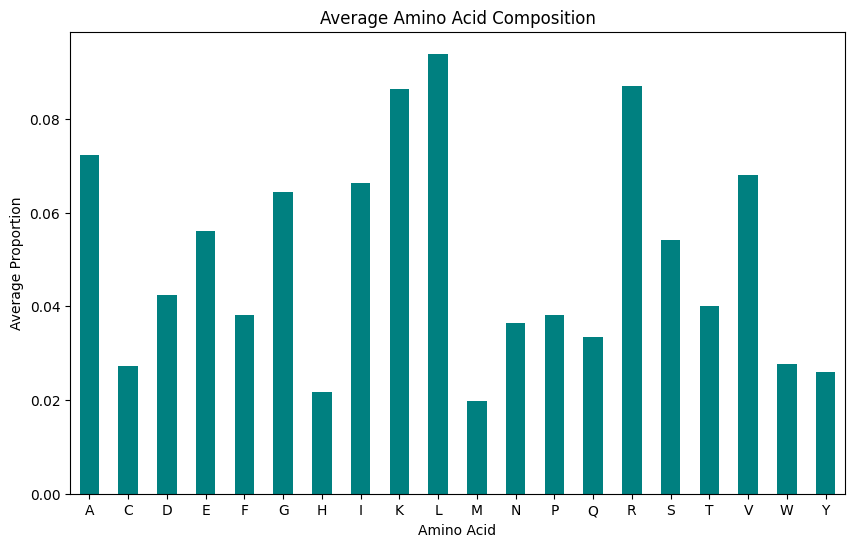

In [ ]:
# Average amino acid composition
aa_columns = [col for col in data.columns if col in 'ACDEFGHIKLMNPQRSTVWY']
aa_mean = data[aa_columns].mean()

plt.figure(figsize=(10, 6))
aa_mean.plot(kind='bar', color='teal')
plt.title('Average Amino Acid Composition')
plt.xlabel('Amino Acid')
plt.ylabel('Average Proportion')
plt.xticks(rotation=0)
plt.show()


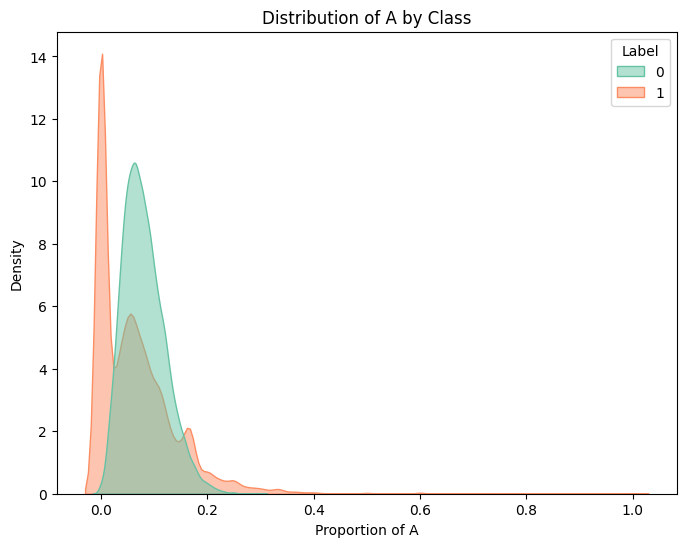

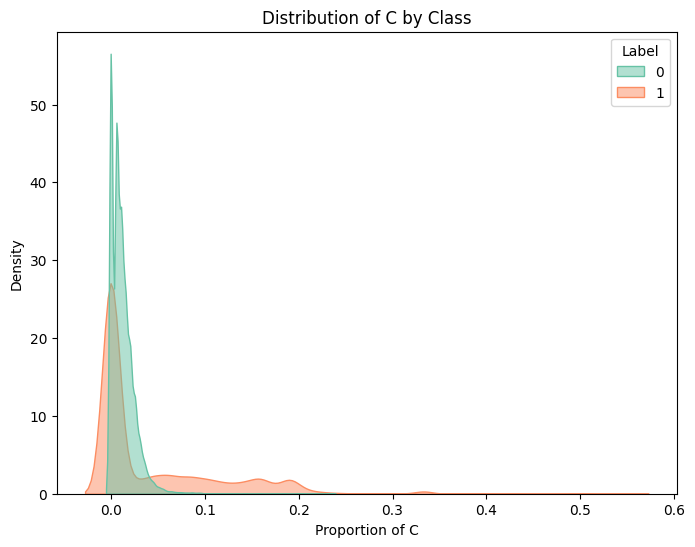

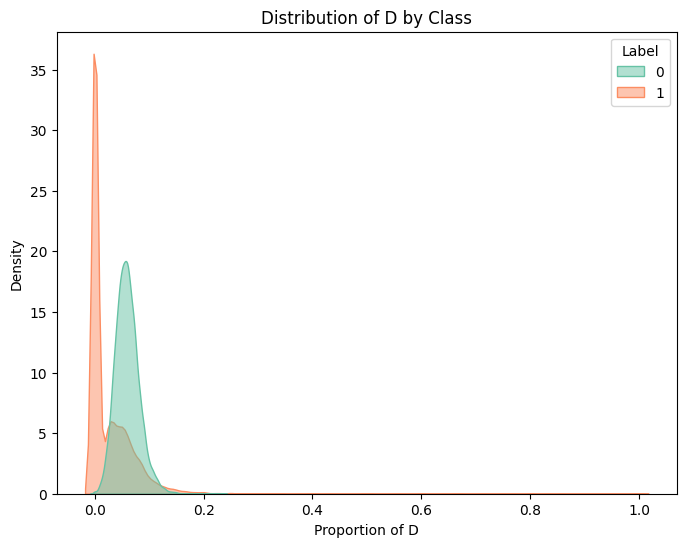

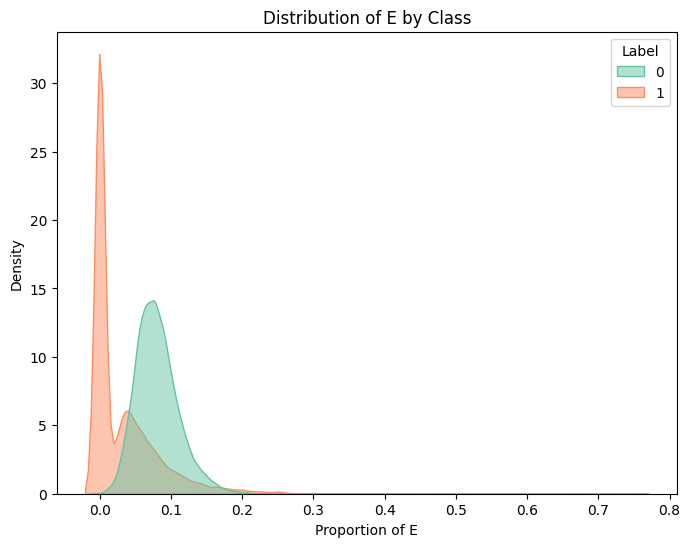

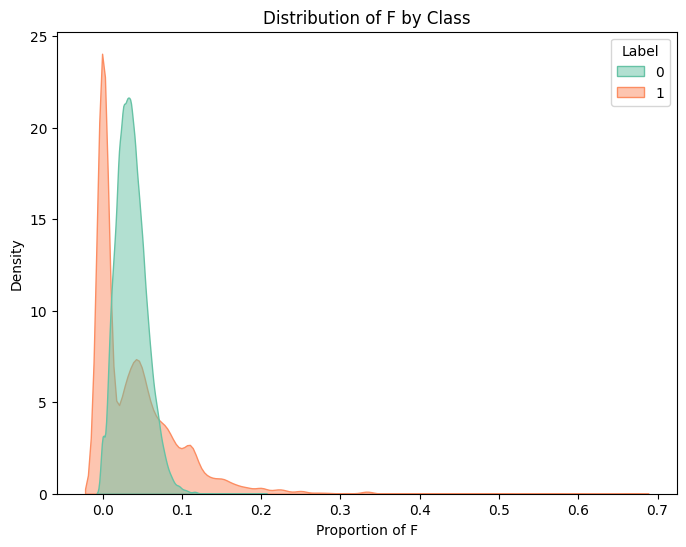

...

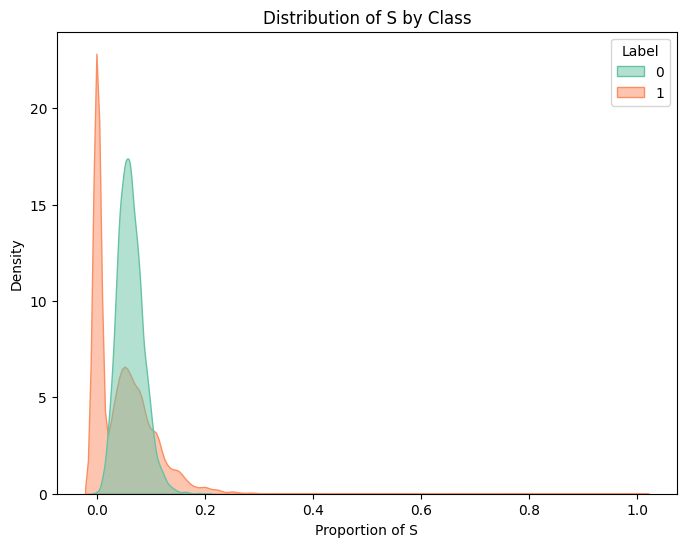

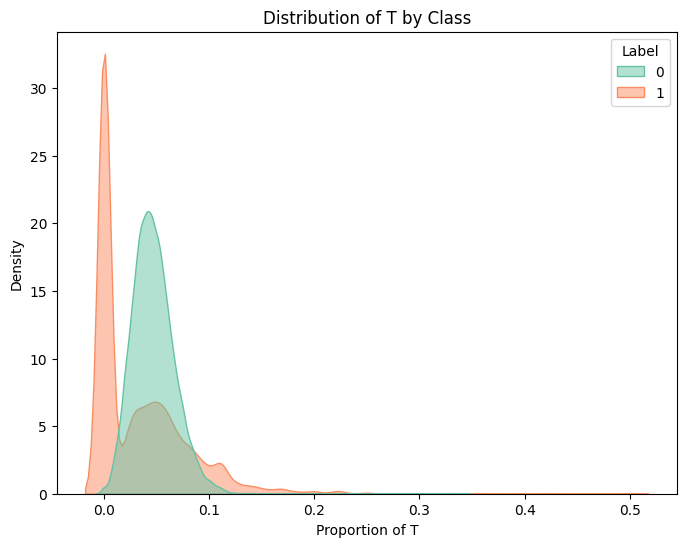

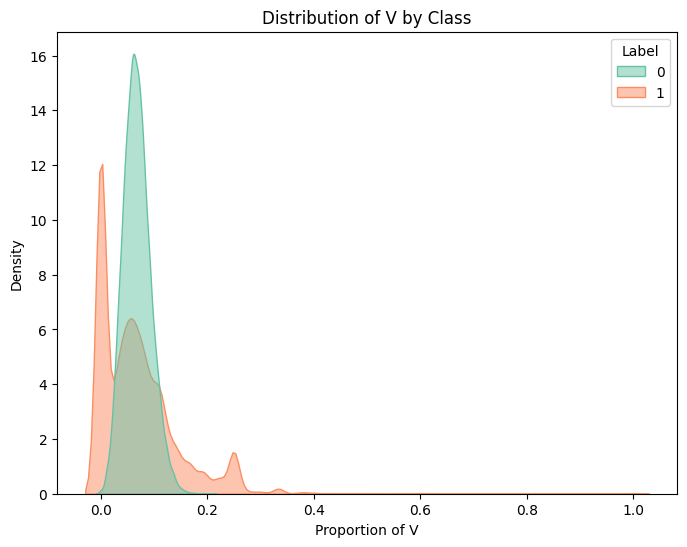

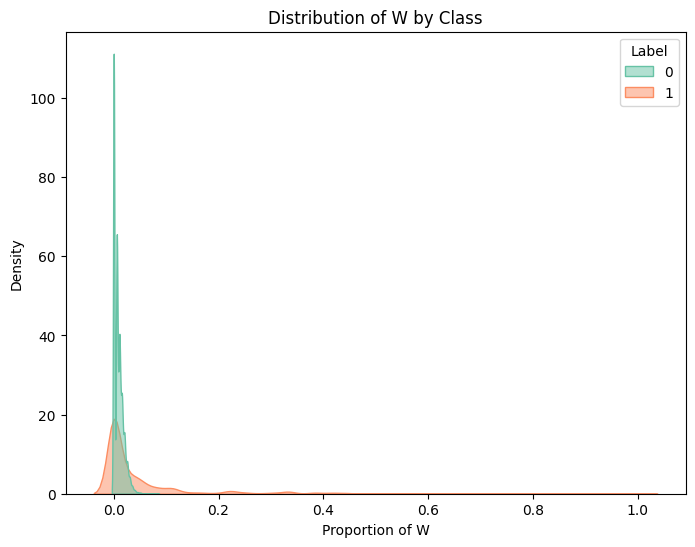

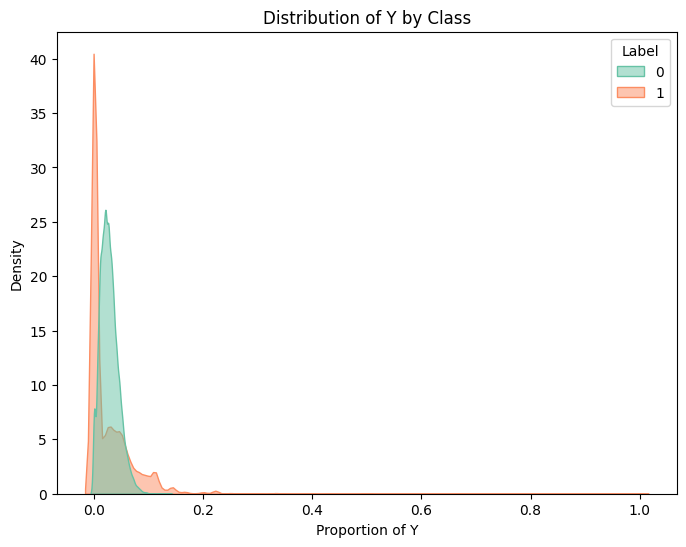

In [ ]:
# Plot amino acid distribution for each class
for aa in aa_columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data=data, x=aa, hue='Label', fill=True, common_norm=False, alpha=0.5, palette='Set2')
    plt.title(f'Distribution of {aa} by Class')
    plt.xlabel(f'Proportion of {aa}')
    plt.ylabel('Density')
    plt.show()


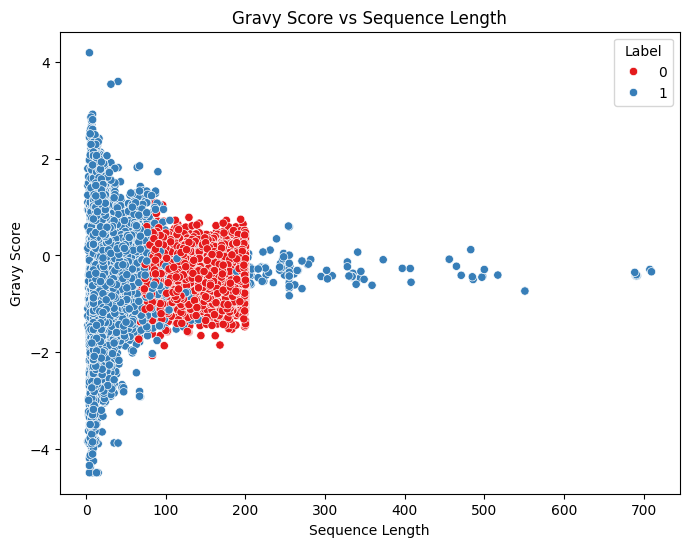

In [ ]:
# Scatter plot for Gravy vs Length
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data, x='Length', y='Gravy', hue='Label', palette='Set1')
plt.title('Gravy Score vs Sequence Length')
plt.xlabel('Sequence Length')
plt.ylabel('Gravy Score')
plt.legend(title='Label')
plt.show()


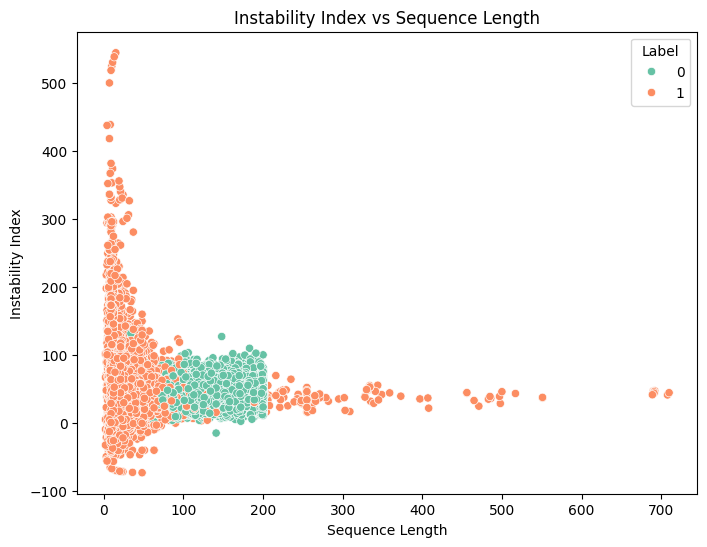

In [ ]:
# Scatter plot for Instability Index vs Length
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data, x='Length', y='Instability_Index', hue='Label', palette='Set2')
plt.title('Instability Index vs Sequence Length')
plt.xlabel('Sequence Length')
plt.ylabel('Instability Index')
plt.legend(title='Label')
plt.show()


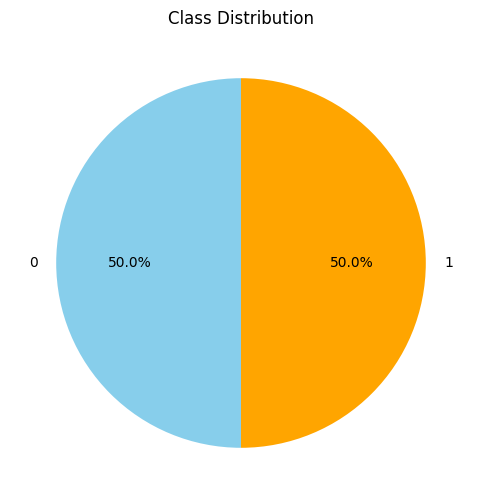

In [ ]:
# Class balance
plt.figure(figsize=(6, 6))
data['Label'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=['skyblue', 'orange'])
plt.title('Class Distribution')
plt.ylabel('')
plt.show()


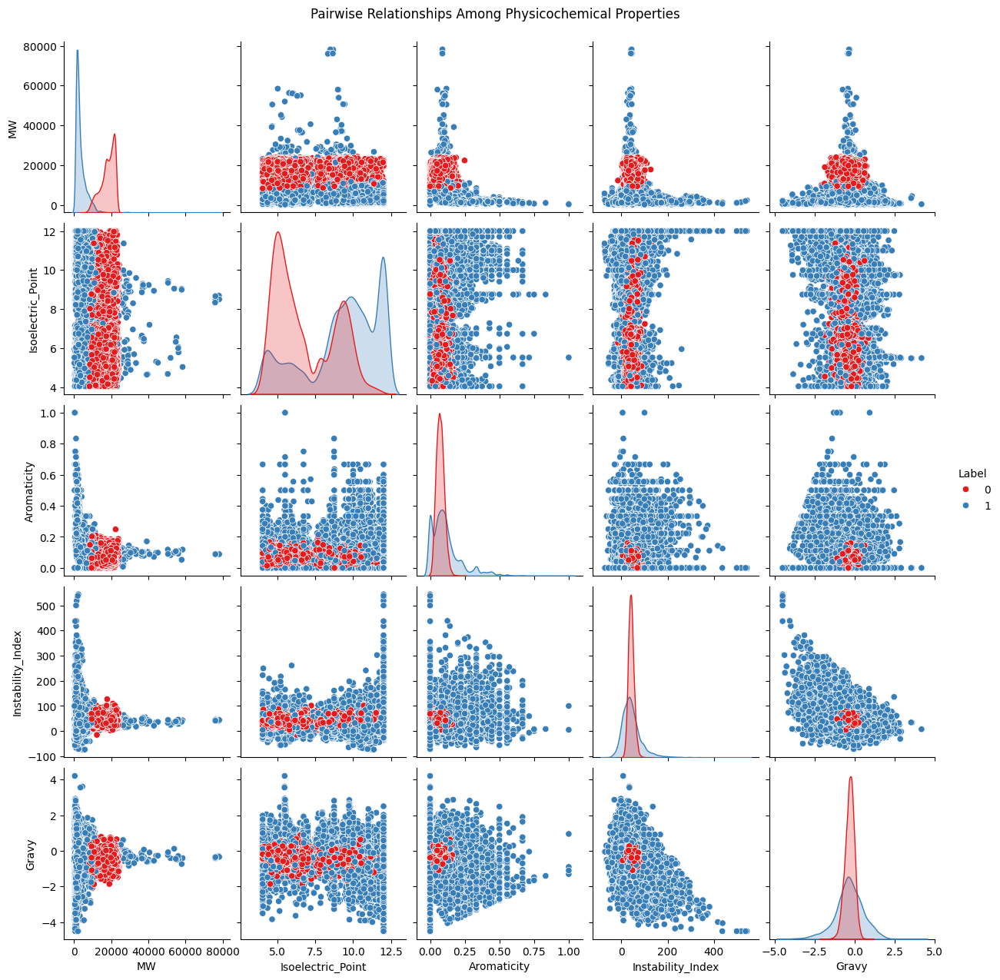

In [ ]:
# Pairplot for physicochemical properties
physico_features = ['MW', 'Isoelectric_Point', 'Aromaticity', 'Instability_Index', 'Gravy']
sns.pairplot(data[physico_features + ['Label']], hue='Label', palette='Set1', diag_kind='kde')
plt.suptitle('Pairwise Relationships Among Physicochemical Properties', y=1.02)
plt.show()


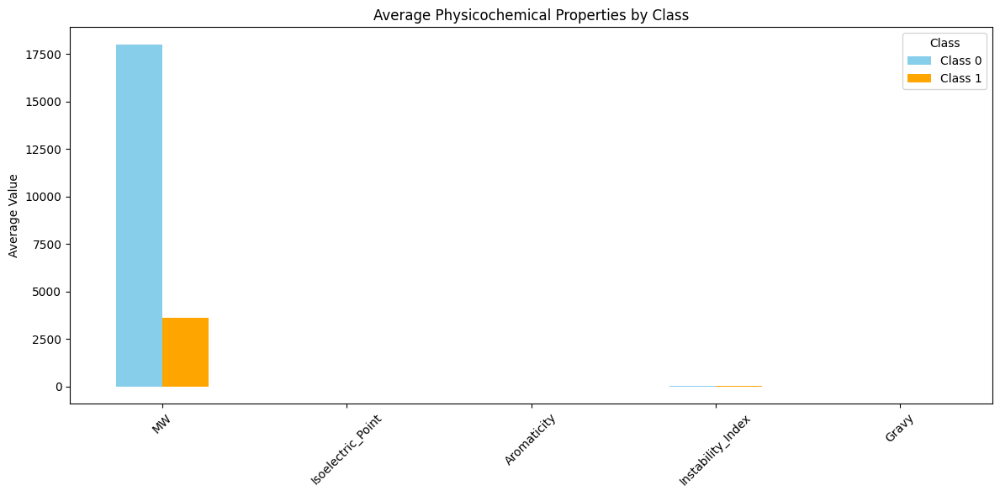

In [ ]:
# Group by Label and calculate mean for physicochemical properties
classwise_means = data.groupby('Label')[physico_features].mean()

classwise_means.T.plot(kind='bar', figsize=(12, 6), color=['skyblue', 'orange'])
plt.title('Average Physicochemical Properties by Class')
plt.ylabel('Average Value')
plt.xticks(rotation=45)
plt.legend(title='Class', labels=['Class 0', 'Class 1'])
plt.tight_layout()
plt.show()


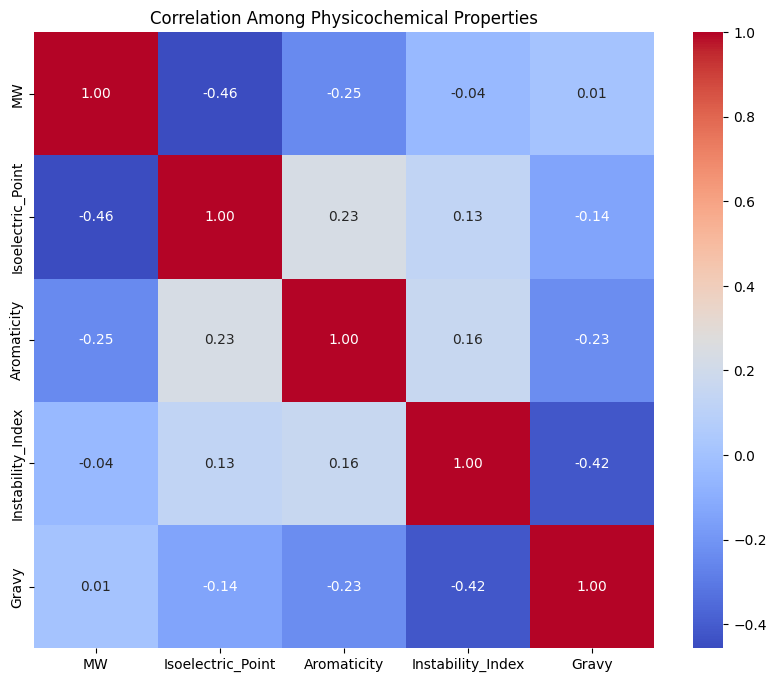

In [ ]:
# Heatmap for physicochemical properties correlation
plt.figure(figsize=(10, 8))
sns.heatmap(data[physico_features].corr(), annot=True, cmap='coolwarm', fmt=".2f", cbar=True)
plt.title('Correlation Among Physicochemical Properties')
plt.show()


<ipython-input-34-12d5b9894f97>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data['Label'], y=data[feature], palette='coolwarm')
<ipython-input-34-12d5b9894f97>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data['Label'], y=data[feature], palette='coolwarm')
<ipython-input-34-12d5b9894f97>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data['Label'], y=data[feature], palette='coolwarm')
<ipython-input-34-12d5b9894f97>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. As

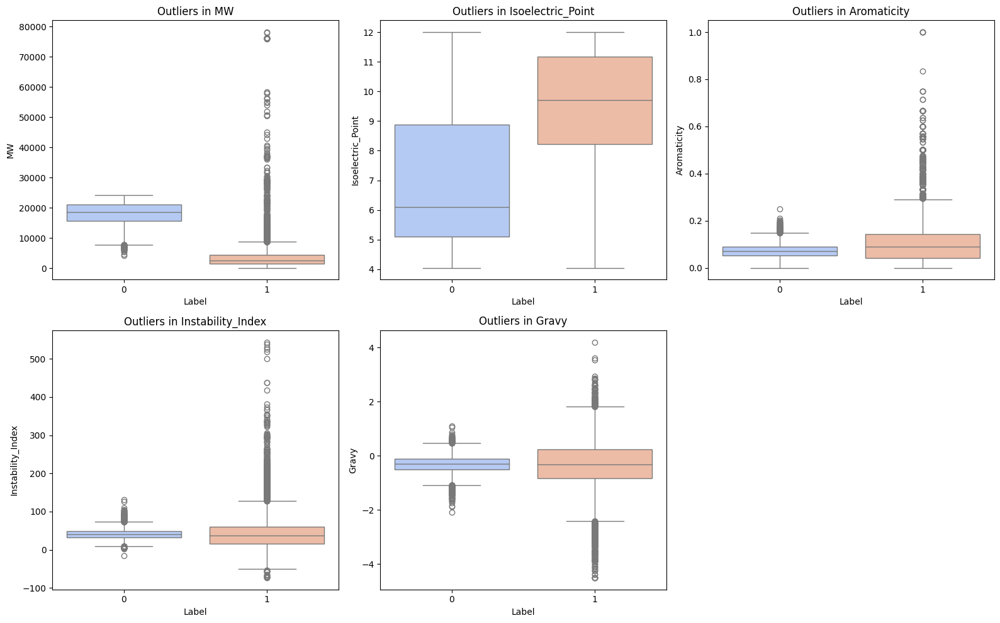

In [ ]:
# Boxplots to identify outliers for physicochemical properties
physico_features = ['MW', 'Isoelectric_Point', 'Aromaticity', 'Instability_Index', 'Gravy']
plt.figure(figsize=(16, 10))
for i, feature in enumerate(physico_features, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(x=data['Label'], y=data[feature], palette='coolwarm')
    plt.title(f'Outliers in {feature}')
plt.tight_layout()
plt.show()


#Feature Scaling and Train Test Split

In [ ]:
# Features and labels
X_seq = sequence_features.drop(columns=['Label'])
y_seq = sequence_features['Label']
# Split data into training and testing sets
X_train_seq, X_test_seq, y_train_seq, y_test_seq = train_test_split(
X_seq, y_seq, test_size=0.2, random_state=42)

In [ ]:
# Initialize the scaler
scaler = StandardScaler()

# Fit on training data and transform
X_train_seq_scaled = scaler.fit_transform(X_train_seq)

# Transform test data
X_test_seq_scaled = scaler.transform(X_test_seq)


#Model Training

Random Forest

In [ ]:
# Initialize Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_model.fit(X_train_seq_scaled, y_train_seq)


RandomForestClassifier(random_state=42)

In [ ]:
# Predict on test data
y_pred_seq = rf_model.predict(X_test_seq_scaled)

# Evaluate the model
print("Sequence-based Model Accuracy:", accuracy_score(y_test_seq, y_pred_seq))
print(classification_report(y_test_seq, y_pred_seq))


Sequence-based Model Accuracy: 0.9839047514055782
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4592
           1       0.99      0.98      0.98      4479

    accuracy                           0.98      9071
   macro avg       0.98      0.98      0.98      9071
weighted avg       0.98      0.98      0.98      9071



In [ ]:
# Predict probabilities for ROC AUC calculation
y_pred_seq_proba = rf_model.predict_proba(X_test_seq_scaled)[:, 1]

# ROC AUC Score
roc_auc_seq = roc_auc_score(y_test_seq, y_pred_seq_proba)
print("Sequence-based Model ROC AUC:", roc_auc_seq)

# Confusion Matrix
cm_seq = confusion_matrix(y_test_seq, y_pred_seq)
print("Sequence-based Model Confusion Matrix:\n", cm_seq)


Sequence-based Model ROC AUC: 0.9978541459058262
Sequence-based Model Confusion Matrix:
 [[4533   59]
 [  87 4392]]


Random Forest Model Classification Report:
              precision    recall  f1-score   support

     Class 0       0.98      0.99      0.98      4592
     Class 1       0.99      0.98      0.98      4479

    accuracy                           0.98      9071
   macro avg       0.98      0.98      0.98      9071
weighted avg       0.98      0.98      0.98      9071



<Figure size 800x600 with 0 Axes>

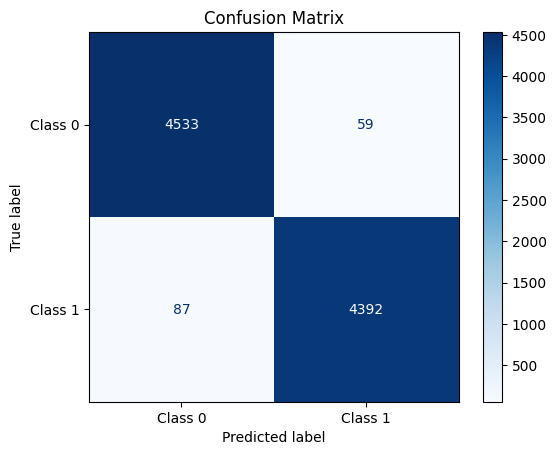

Accuracy: 0.9839
ROC AUC Score: 0.9979


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# Make predictions
y_pred = rf_model.predict(X_test_seq_scaled)
y_pred_prob = rf_model.predict_proba(X_test_seq_scaled)[:, 1]

# Classification Report
print("Random Forest Model Classification Report:")
report = classification_report(y_test_seq, y_pred, target_names=['Class 0', 'Class 1'])
print(report)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_seq, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Class 0', 'Class 1'])

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix")
plt.show()

# Additional Metrics
accuracy = accuracy_score(y_test_seq, y_pred)
print(f"Accuracy: {accuracy:.4f}")

roc_auc = roc_auc_score(y_test_seq, y_pred_prob)
print(f"ROC AUC Score: {roc_auc:.4f}")


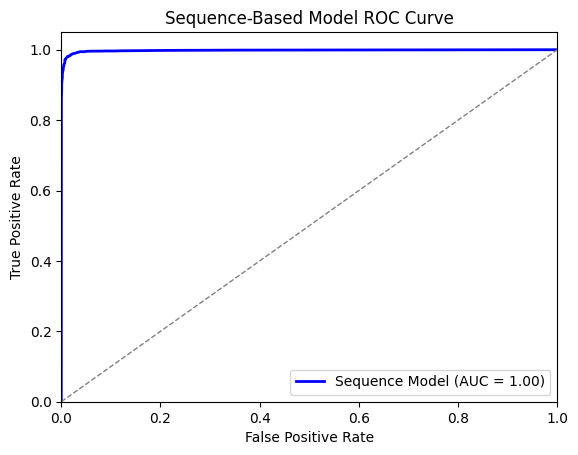

In [ ]:
# Calculate ROC curve
fpr_seq, tpr_seq, _ = roc_curve(y_test_seq, y_pred_seq_proba)
roc_auc_seq = auc(fpr_seq, tpr_seq)

# Plot ROC curve
plt.figure()
plt.plot(fpr_seq, tpr_seq, color='blue', lw=2, label='Sequence Model (AUC = %0.2f)' % roc_auc_seq)
plt.plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Sequence-Based Model ROC Curve')
plt.legend(loc="lower right")
plt.show()


Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

# Initialize Logistic Regression
lr_model = LogisticRegression(random_state=42, max_iter=1000)

# Train the model
lr_model.fit(X_train_seq_scaled, y_train_seq)

# Predict on test data
y_pred_lr = lr_model.predict(X_test_seq_scaled)
y_pred_lr_proba = lr_model.predict_proba(X_test_seq_scaled)[:, 1]

# Evaluate the model
accuracy_lr = accuracy_score(y_test_seq, y_pred_lr)
roc_auc_lr = roc_auc_score(y_test_seq, y_pred_lr_proba)
conf_matrix_lr = confusion_matrix(y_test_seq, y_pred_lr)

print("Logistic Regression Model Accuracy:", accuracy_lr)
print("Logistic Regression Model ROC AUC:", roc_auc_lr)
print("Logistic Regression Model Confusion Matrix:\n", conf_matrix_lr)
print("Logistic Regression Classification Report:")
print(classification_report(y_test_seq, y_pred_lr))


Logistic Regression Model Accuracy: 0.9747547128210782
Logistic Regression Model ROC AUC: 0.9927392485100814
Logistic Regression Model Confusion Matrix:
 [[4486  106]
 [ 123 4356]]
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      4592
           1       0.98      0.97      0.97      4479

    accuracy                           0.97      9071
   macro avg       0.97      0.97      0.97      9071
weighted avg       0.97      0.97      0.97      9071



<Figure size 800x600 with 0 Axes>

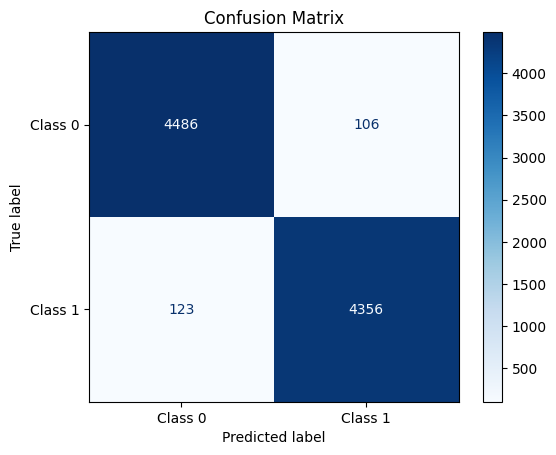

In [ ]:

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_seq, y_pred_lr)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Class 0', 'Class 1'])

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix")
plt.show()


Support vector machines

In [ ]:
from sklearn.svm import SVC

# Initialize SVM with probability estimates
svm_model = SVC(kernel='rbf', probability=True, random_state=42)

# Train the model
svm_model.fit(X_train_seq_scaled, y_train_seq)

# Predict on test data
y_pred_svm = svm_model.predict(X_test_seq_scaled)
y_pred_svm_proba = svm_model.predict_proba(X_test_seq_scaled)[:, 1]

# Evaluate the model
accuracy_svm = accuracy_score(y_test_seq, y_pred_svm)
roc_auc_svm = roc_auc_score(y_test_seq, y_pred_svm_proba)
conf_matrix_svm = confusion_matrix(y_test_seq, y_pred_svm)

print("SVM Model Accuracy:", accuracy_svm)
print("SVM Model ROC AUC:", roc_auc_svm)
print("SVM Model Confusion Matrix:\n", conf_matrix_svm)
print("SVM Classification Report:")
print(classification_report(y_test_seq, y_pred_svm))


SVM Model Accuracy: 0.9810384742586264
SVM Model ROC AUC: 0.9967495427753053
SVM Model Confusion Matrix:
 [[4526   66]
 [ 106 4373]]
SVM Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4592
           1       0.99      0.98      0.98      4479

    accuracy                           0.98      9071
   macro avg       0.98      0.98      0.98      9071
weighted avg       0.98      0.98      0.98      9071



<Figure size 800x600 with 0 Axes>

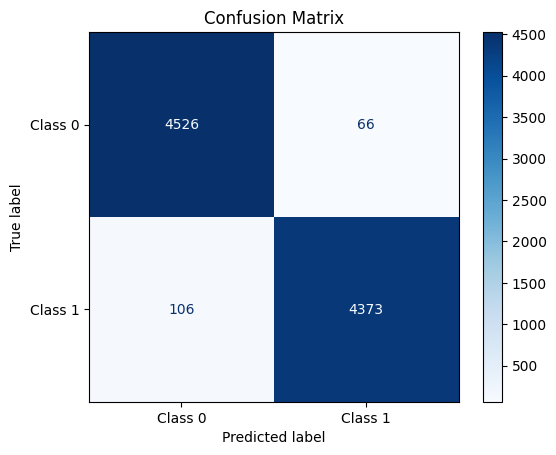

In [ ]:

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_seq, y_pred_svm)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Class 0', 'Class 1'])

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix")
plt.show()


xgboost

In [ ]:
from xgboost import XGBClassifier

# Initialize XGBoost Classifier
xgb_model = XGBClassifier(n_estimators=100, use_label_encoder=False, eval_metric='logloss', random_state=42)

# Train the model
xgb_model.fit(X_train_seq_scaled, y_train_seq)

# Predict on test data
y_pred_xgb = xgb_model.predict(X_test_seq_scaled)
y_pred_xgb_proba = xgb_model.predict_proba(X_test_seq_scaled)[:, 1]

# Evaluate the model
accuracy_xgb = accuracy_score(y_test_seq, y_pred_xgb)
roc_auc_xgb = roc_auc_score(y_test_seq, y_pred_xgb_proba)
conf_matrix_xgb = confusion_matrix(y_test_seq, y_pred_xgb)

print("XGBoost Model Accuracy:", accuracy_xgb)
print("XGBoost Model ROC AUC:", roc_auc_xgb)
print("XGBoost Model Confusion Matrix:\n", conf_matrix_xgb)
print("XGBoost Classification Report:")
print(classification_report(y_test_seq, y_pred_xgb))


XGBoost Model Accuracy: 0.9836842685481204
XGBoost Model ROC AUC: 0.998027112393648
XGBoost Model Confusion Matrix:
 [[4530   62]
 [  86 4393]]
XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4592
           1       0.99      0.98      0.98      4479

    accuracy                           0.98      9071
   macro avg       0.98      0.98      0.98      9071
weighted avg       0.98      0.98      0.98      9071



<Figure size 800x600 with 0 Axes>

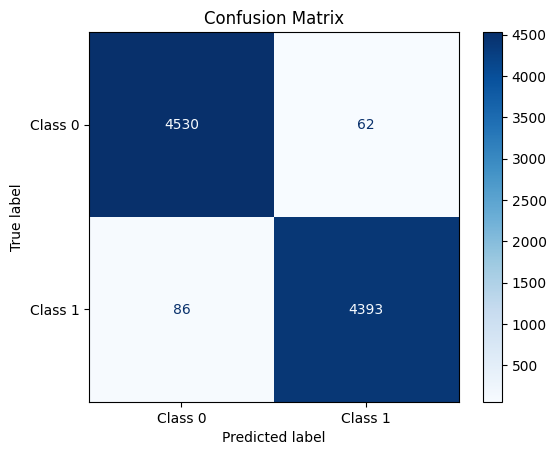

In [ ]:

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_seq, y_pred_xgb)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Class 0', 'Class 1'])

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix")
plt.show()


RNN

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

X_train_seq_rnn = X_train_seq_scaled.reshape((X_train_seq_scaled.shape[0], X_train_seq_scaled.shape[1], 1))
X_test_seq_rnn = X_test_seq_scaled.reshape((X_test_seq_scaled.shape[0], X_test_seq_scaled.shape[1], 1))

# Define the RNN model
rnn_model = Sequential([
    LSTM(64, input_shape=(X_train_seq_rnn.shape[1], X_train_seq_rnn.shape[2]), return_sequences=True),
    Dropout(0.5),
    LSTM(32),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compile the model
rnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history_rnn = rnn_model.fit(
    X_train_seq_rnn, y_train_seq,
    epochs=50,
    batch_size=16,
    validation_split=0.1,
    verbose=0
)

# Evaluate the model
test_loss_rnn, test_acc_rnn = rnn_model.evaluate(X_test_seq_rnn, y_test_seq, verbose=0)
print('RNN Model Test Accuracy:', test_acc_rnn)

# Make predictions
y_pred_rnn_proba = rnn_model.predict(X_test_seq_rnn).flatten()
y_pred_rnn = (y_pred_rnn_proba > 0.5).astype(int)

# Classification Report
print("RNN Classification Report:")
print(classification_report(y_test_seq, y_pred_rnn))

# Confusion Matrix
conf_matrix_rnn = confusion_matrix(y_test_seq, y_pred_rnn)
print("RNN Confusion Matrix:\n", conf_matrix_rnn)

# ROC AUC Score
roc_auc_rnn = roc_auc_score(y_test_seq, y_pred_rnn_proba)
print("RNN ROC AUC:", roc_auc_rnn)


/opt/conda/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


RNN Model Test Accuracy: 0.9774004817008972
284/284 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
RNN Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      4592
           1       0.98      0.98      0.98      4479

    accuracy                           0.98      9071
   macro avg       0.98      0.98      0.98      9071
weighted avg       0.98      0.98      0.98      9071

RNN Confusion Matrix:
 [[4484  108]
 [  97 4382]]
RNN ROC AUC: 0.9962828371346579


<Figure size 800x600 with 0 Axes>

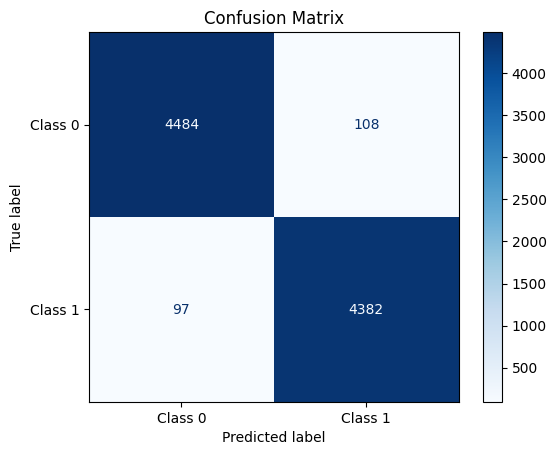

In [ ]:

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_seq, y_pred_rnn)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Class 0', 'Class 1'])

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix")
plt.show()


#Image Data Generation And Preprocessing

We utilized AlphaFold to generate the 3D structure of our sequence data. To manage this information efficiently, we created a CSV file, and subsequently converted the 3D structure into a 2D representation to facilitate its integration into deep learning models.

In [ ]:
# Select a subset for structural analysis
structure_data = balanced_data.sample(n=100, random_state=42).reset_index(drop=True)
structure_data.to_csv('structure_sequences.csv', index=False)

In [ ]:
structure_samples = pd.read_csv('/kaggle/input/label38/file_for_label.csv')


In [ ]:
import os

os.makedirs('pdb_structures/pdb_structures', exist_ok=True)

# Generate list of PDB file names
pdb_files = ['pdb_structures/{}_label_{}.pdb'.format(row['Identifier'], row['Label']) for idx, row in structure_samples.iterrows()]


In [ ]:
# Create the 'images' directory if it doesn't exist
os.makedirs('images', exist_ok=True)

for idx, row in structure_samples.iterrows():
    pdb_file = 'pdb_structures/{}_label_{}.pdb'.format(row['Identifier'], row['Label'])
    pdb_id = '{}_label_{}'.format(row['Identifier'], row['Label'])
    cmd = f"pymol -cq -d 'load {pdb_file}; hide everything; show cartoon; set ray_opaque_background, off; ray 800,600; png images/{pdb_id}.png; quit;'"
    os.system(cmd)


pymol -cq: Runs PyMOL in command-line mode without launching the GUI.

load {pdb_file}: Loads the 3D structure from the specified PDB file into PyMOL.

hide everything: Hides all default molecular representations.

show cartoon: Displays the structure in a "cartoon" representation, typically used for proteins to show secondary structures like alpha-helices and beta-sheets.


set ray_opaque_background, off: Ensures that the background is transparent (useful for images).

ray 800,600: Renders the scene with specified dimensions (800x600 pixels).

png images/{pdb_id}.png: Saves the rendered image as a PNG file in the images directory, using the PDB ID and label as the filename.

quit;: Closes PyMOL after the image is saved.

In [ ]:
from PIL import Image
import numpy as np

image_paths = []
image_labels = []

for idx, row in structure_samples.iterrows():
    image_path = '/kaggle/input/images38/images/{}_label_{}.png'.format(row['Identifier'], row['Label'])
    if os.path.exists(image_path):
        image_paths.append(image_path)
        image_labels.append(row['Label'])
    else:
        print(f"Image not found: {image_path}")

# Preprocess images
def preprocess_image(image_path):
    image = Image.open(image_path).convert('RGB')
    image = image.resize((224, 224))
    image_array = np.array(image) / 255.0  # Normalize pixel values
    return image_array

images = [preprocess_image(path) for path in image_paths]

# Convert to numpy arrays
X_img = np.array(images)
y_img = np.array(image_labels)


# Train Test split

In [ ]:
# Ensure images and labels are numpy arrays
X_img = images
y_img = image_labels

# Split data into training and testing sets
X_train_img, X_test_img, y_train_img, y_test_img = train_test_split(
    X_img, y_img, test_size=0.2, random_state=42)


In [ ]:
import numpy as np

# Ensure X_train_img is a NumPy array
X_train_img = np.array(X_train_img)

# Ensure y_train_img is a NumPy array
y_train_img = np.array(y_train_img)

# Check their shapes to ensure compatibility
print("X_train_img shape:", X_train_img.shape)
print("y_train_img shape:", y_train_img.shape)

X_train_img shape: (30, 224, 224, 3)
y_train_img shape: (30,)


In [ ]:
print("X_train_img dtype:", X_train_img.dtype)
print("y_train_img dtype:", y_train_img.dtype)


X_train_img dtype: float64
y_train_img dtype: int64


CNN

In [ ]:
# Define the CNN model
cnn_model = models.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(224, 224, 3)),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(128, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(1, activation='sigmoid')  # For binary classification
])



/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
cnn_model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,089 (42.61 MB)

 Trainable params: 11,169,089 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Compile the model
cnn_model.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=['accuracy'])



In [ ]:
# Train the model
history = cnn_model.fit(
    X_train_img, y_train_img,
    epochs=15,
    batch_size=16,
    validation_split=0.1  # Ensure all inputs are compatible
)


Epoch 1/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.3719 - loss: 2.7123 - val_accuracy: 0.6667 - val_loss: 0.7720
Epoch 2/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.5579 - loss: 0.9564 - val_accuracy: 0.3333 - val_loss: 0.9632
Epoch 3/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.4668 - loss: 0.8168 - val_accuracy: 0.3333 - val_loss: 0.7123
Epoch 4/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.5123 - loss: 0.6895 - val_accuracy: 0.6667 - val_loss: 0.6609
Epoch 5/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.4707 - loss: 0.7062 - val_accuracy: 0.6667 - val_loss: 0.6710
Epoch 6/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.4915 - loss: 0.6849 - val_accuracy: 0.6667 - val_loss: 0.6637
Epoch 7/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.5332 - loss: 0.6724 - val_accuracy: 0.6667 - val_loss: 0.6673
Epoch 8/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - accuracy: 0.5748 - loss: 0.6518 - val_accuracy: 0.6667 - val_loss: 0.6863
Ep

In [ ]:
import numpy as np

# Ensure X_test_img is a single NumPy array
X_test_img = np.array(X_test_img)

# Ensure y_test_img is a NumPy array
y_test_img = np.array(y_test_img)

# Check their shapes to confirm compatibility
print("X_test_img shape:", X_test_img.shape)
print("y_test_img shape:", y_test_img.shape)

# Evaluate the model on test data
test_loss, test_acc = cnn_model.evaluate(X_test_img, y_test_img)
print('Image-based Model Test Accuracy:', test_acc)


X_test_img shape: (8, 224, 224, 3)
y_test_img shape: (8,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.8750 - loss: 0.7394
Image-based Model Test Accuracy: 0.875


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
Image-based Model Classification Report:
              precision    recall  f1-score   support

           0       0.67      1.00      0.80         2
           1       1.00      0.83      0.91         6

    accuracy                           0.88         8
   macro avg       0.83      0.92      0.85         8
weighted avg       0.92      0.88      0.88         8

Confusion Matrix:
[[2 0]
 [1 5]]


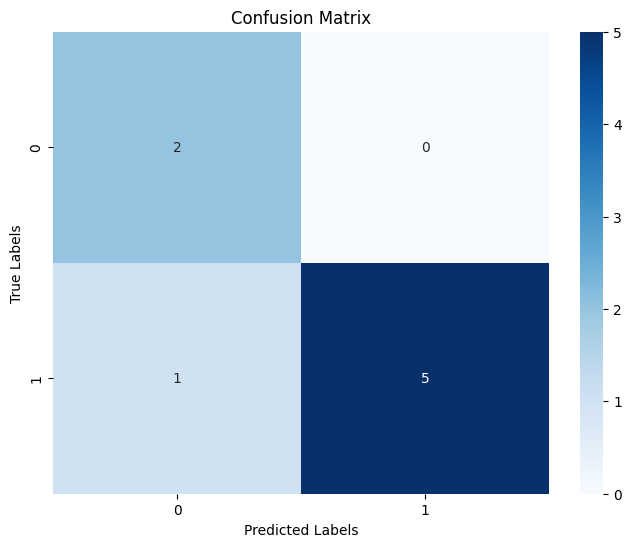

In [ ]:
import seaborn as sns

# Make predictions on the test set
y_pred_img = cnn_model.predict(X_test_img)
y_pred_img = (y_pred_img > 0.5).astype(int).flatten()

# Generate a classification report
print("Image-based Model Classification Report:")
print(classification_report(y_test_img, y_pred_img))

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test_img, y_pred_img)
print("Confusion Matrix:")
print(conf_matrix)

# Visualize confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
# Predict probabilities for ROC AUC calculation
y_pred_img_proba = cnn_model.predict(X_test_img).flatten()

# ROC AUC Score
roc_auc_img = roc_auc_score(y_test_img, y_pred_img_proba)
print("Image-based Model ROC AUC:", roc_auc_img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Image-based Model ROC AUC: 0.8333333333333334


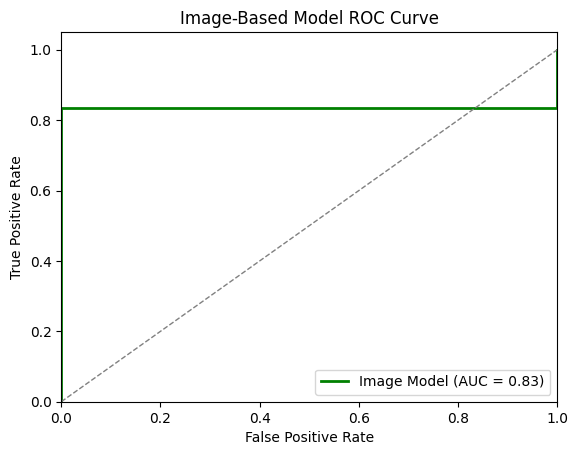

In [ ]:
# Calculate ROC curve
fpr_img, tpr_img, _ = roc_curve(y_test_img, y_pred_img_proba)
roc_auc_img = auc(fpr_img, tpr_img)

# Plot ROC curve
plt.figure()
plt.plot(fpr_img, tpr_img, color='green', lw=2, label='Image Model (AUC = %0.2f)' % roc_auc_img)
plt.plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Image-Based Model ROC Curve')
plt.legend(loc="lower right")
plt.show()


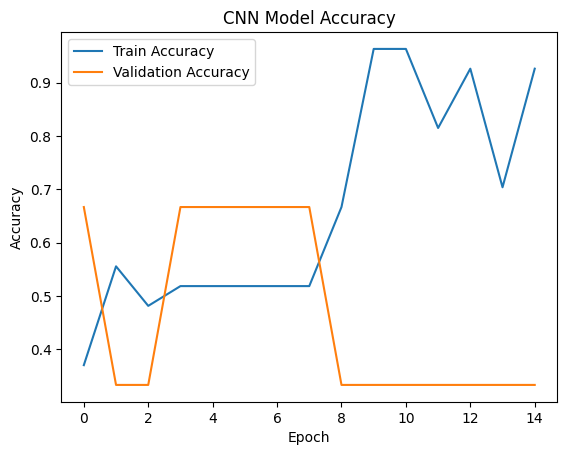

In [ ]:
# Plot training & validation accuracy values
plt.figure()
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('CNN Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.show()


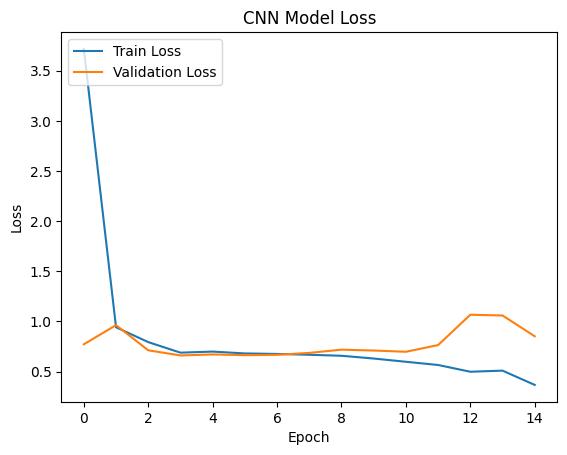

In [ ]:
# Plot training & validation loss values
plt.figure()
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('CNN Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.show()


VGG16 Transfer Learning

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Load VGG16 with pre-trained ImageNet weights, exclude top layers
vgg16_base = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
vgg16_base.trainable = False

# Create the model
vgg16_model = models.Sequential([
    vgg16_base,
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

# Compile the model
vgg16_model.compile(optimizer=Adam(learning_rate=1e-4),
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

# Train the model
history_vgg16 = vgg16_model.fit(
    X_train_img, y_train_img,
    epochs=20,
    batch_size=16,
    validation_split=0.1,
    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)],
    verbose=0
)

# Evaluate the model
test_loss_vgg16, test_acc_vgg16 = vgg16_model.evaluate(X_test_img, y_test_img, verbose=0)
print('VGG16 Model Test Accuracy:', test_acc_vgg16)

# Make predictions
y_pred_vgg16 = vgg16_model.predict(X_test_img)
y_pred_vgg16_class = (y_pred_vgg16 > 0.5).astype(int).flatten()

# Classification Report
print("VGG16 Classification Report:")
print(classification_report(y_test_img, y_pred_vgg16_class))

# Confusion Matrix
conf_matrix_vgg16 = confusion_matrix(y_test_img, y_pred_vgg16_class)
print("VGG16 Confusion Matrix:\n", conf_matrix_vgg16)

# ROC AUC Score
roc_auc_vgg16 = roc_auc_score(y_test_img, y_pred_vgg16)
print("VGG16 ROC AUC:", roc_auc_vgg16)


VGG16 Model Test Accuracy: 0.25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step
VGG16 Classification Report:
              precision    recall  f1-score   support

           0       0.25      1.00      0.40         2
           1       0.00      0.00      0.00         6

    accuracy                           0.25         8
   macro avg       0.12      0.50      0.20         8
weighted avg       0.06      0.25      0.10         8

VGG16 Confusion Matrix:
 [[2 0]
 [6 0]]
VGG16 ROC AUC: 0.41666666666666663


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<Figure size 800x600 with 0 Axes>

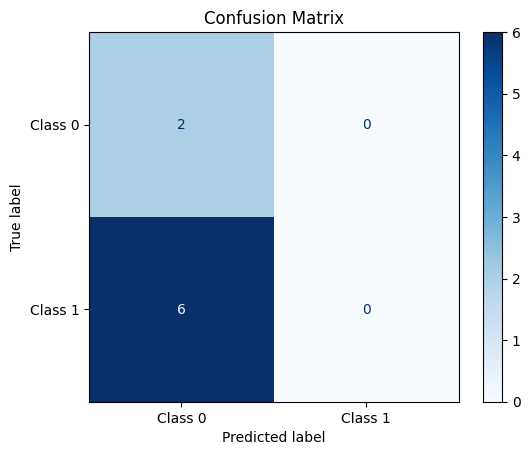

In [ ]:

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_img, y_pred_vgg16_class)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Class 0', 'Class 1'])

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix")
plt.show()


ResNet50 Transfer Learning

In [ ]:
from tensorflow.keras.applications import ResNet50

# Load ResNet50 with pre-trained ImageNet weights, exclude top layers
resnet50_base = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
resnet50_base.trainable = False

# Create the model
resnet50_model = models.Sequential([
    resnet50_base,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

# Compile the model
resnet50_model.compile(optimizer=Adam(learning_rate=1e-4),
                       loss='binary_crossentropy',
                       metrics=['accuracy'])

# Train the model
history_resnet50 = resnet50_model.fit(
    X_train_img, y_train_img,
    epochs=20,
    batch_size=16,
    validation_split=0.1,
    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)],
    verbose=0
)

# Evaluate the model
test_loss_resnet50, test_acc_resnet50 = resnet50_model.evaluate(X_test_img, y_test_img, verbose=0)
print('ResNet50 Model Test Accuracy:', test_acc_resnet50)

# Make predictions
y_pred_resnet50 = resnet50_model.predict(X_test_img)
y_pred_resnet50_class = (y_pred_resnet50 > 0.5).astype(int).flatten()

# Classification Report
print("ResNet50 Classification Report:")
print(classification_report(y_test_img, y_pred_resnet50_class))

# Confusion Matrix
conf_matrix_resnet50 = confusion_matrix(y_test_img, y_pred_resnet50_class)
print("ResNet50 Confusion Matrix:\n", conf_matrix_resnet50)

# ROC AUC Score
roc_auc_resnet50 = roc_auc_score(y_test_img, y_pred_resnet50)
print("ResNet50 ROC AUC:", roc_auc_resnet50)


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
ResNet50 Model Test Accuracy: 0.25
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
ResNet50 Classification Report:
              precision    recall  f1-score   support

           0       0.25      1.00      0.40         2
           1       0.00      0.00      0.00         6

    accuracy                           0.25         8
   macro avg       0.12      0.50      0.20         8
weighted avg       0.06      0.25      0.10         8

ResNet50 Confusion Matrix:
 [[2 0]
 [6 0]]
ResNet50 ROC AUC: 0.6666666666666667


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<Figure size 800x600 with 0 Axes>

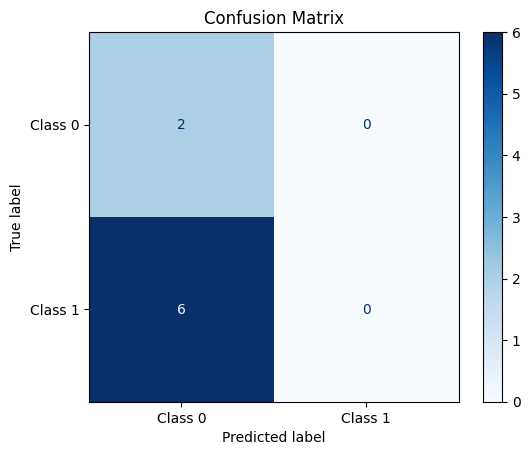

In [ ]:

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_img, y_pred_resnet50_class)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Class 0', 'Class 1'])

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix")
plt.show()


InceptionV3 Transfer Learning

In [ ]:
from tensorflow.keras.applications import InceptionV3

# Load InceptionV3 with pre-trained ImageNet weights, exclude top layers
inceptionv3_base = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model
inceptionv3_base.trainable = False

# Create the model
inceptionv3_model = models.Sequential([
    inceptionv3_base,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

# Compile the model
inceptionv3_model.compile(optimizer=Adam(learning_rate=1e-4),
                          loss='binary_crossentropy',
                          metrics=['accuracy'])

# Train the model
history_inceptionv3 = inceptionv3_model.fit(
    X_train_img, y_train_img,
    epochs=20,
    batch_size=16,
    validation_split=0.1,
    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)],
    verbose=0
)

# Evaluate the model
test_loss_inceptionv3, test_acc_inceptionv3 = inceptionv3_model.evaluate(X_test_img, y_test_img, verbose=0)
print('InceptionV3 Model Test Accuracy:', test_acc_inceptionv3)

# Make predictions
y_pred_inceptionv3 = inceptionv3_model.predict(X_test_img)
y_pred_inceptionv3_class = (y_pred_inceptionv3 > 0.5).astype(int).flatten()

# Classification Report
print("InceptionV3 Classification Report:")
print(classification_report(y_test_img, y_pred_inceptionv3_class))

# Confusion Matrix
conf_matrix_inceptionv3 = confusion_matrix(y_test_img, y_pred_inceptionv3_class)
print("InceptionV3 Confusion Matrix:\n", conf_matrix_inceptionv3)

# ROC AUC Score
roc_auc_inceptionv3 = roc_auc_score(y_test_img, y_pred_inceptionv3)
print("InceptionV3 ROC AUC:", roc_auc_inceptionv3)


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
InceptionV3 Model Test Accuracy: 0.375
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
InceptionV3 Classification Report:
              precision    recall  f1-score   support

           0       0.29      1.00      0.44         2
           1       1.00      0.17      0.29         6

    accuracy                           0.38         8
   macro avg       0.64      0.58      0.37         8
weighted avg       0.82      0.38      0.33         8

InceptionV3 Confusion Matrix:
 [[2 0]
 [5 1]]
InceptionV3 ROC AUC: 0.6666666666666666


<Figure size 800x600 with 0 Axes>

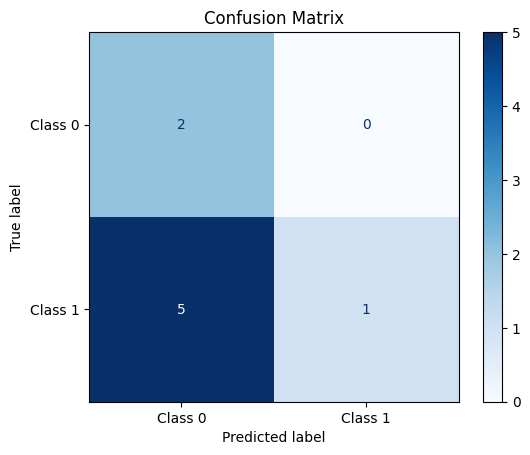

In [ ]:

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_img, y_pred_inceptionv3_class)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Class 0', 'Class 1'])

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix")
plt.show()


Compile Metrics for Sequence-Based Models

In [ ]:
# Create a DataFrame to store sequence-based model metrics
sequence_metrics = pd.DataFrame({
    'Model': ['Random Forest', 'Logistic Regression', 'SVM', 'XGBoost', 'RNN'],
    'Accuracy': [accuracy_score(y_test_seq, y_pred_seq),
                 accuracy_lr,
                 accuracy_svm,
                 accuracy_xgb,
                 test_acc_rnn],
    'ROC AUC': [roc_auc_seq,
                roc_auc_lr,
                roc_auc_svm,
                roc_auc_xgb,
                roc_auc_rnn]
})

print("Sequence-Based Models Performance:")
print(sequence_metrics)


Sequence-Based Models Performance:
                 Model  Accuracy   ROC AUC
0        Random Forest  0.983905  0.997854
1  Logistic Regression  0.974755  0.992739
2                  SVM  0.981038  0.996750
3              XGBoost  0.983684  0.998027
4                  RNN  0.977400  0.996283


In [ ]:
# Create a DataFrame to store image-based model metrics
image_metrics = pd.DataFrame({
    'Model': ['CNN', 'VGG16', 'ResNet50', 'InceptionV3'],
    'Accuracy': [test_acc,
                 test_acc_vgg16,
                 test_acc_resnet50,
                 test_acc_inceptionv3],
    'ROC AUC': [roc_auc_img,
                roc_auc_vgg16,
                roc_auc_resnet50,
                roc_auc_inceptionv3]
})

print("Image-Based Models Performance:")
print(image_metrics)


Image-Based Models Performance:
         Model  Accuracy   ROC AUC
0          CNN     0.750  0.833333
1        VGG16     0.250  0.416667
2     ResNet50     0.250  0.666667
3  InceptionV3     0.375  0.666667


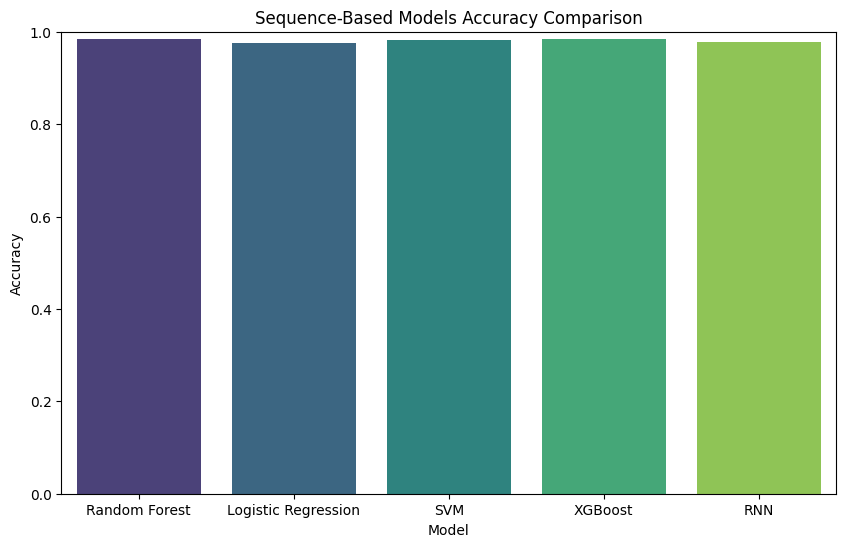

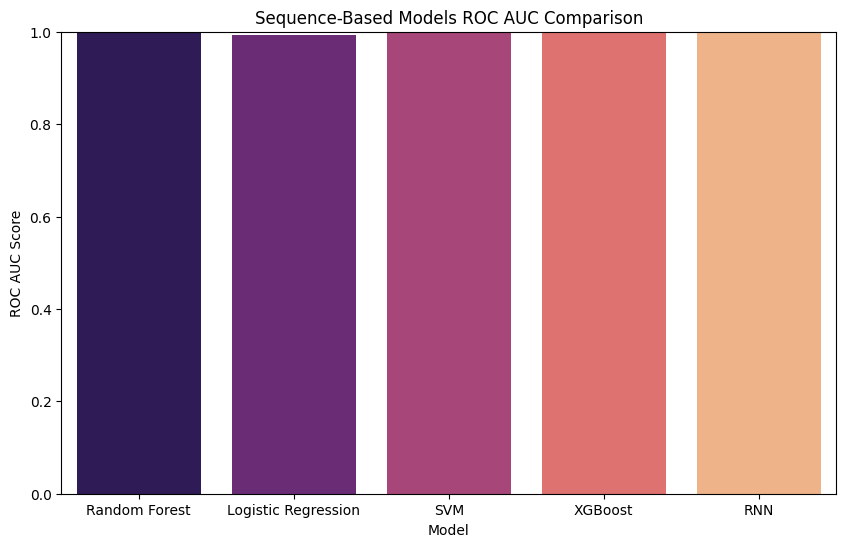

In [ ]:
import seaborn as sns

# Plot Accuracy Comparison
plt.figure(figsize=(10,6))
sns.barplot(x='Model', y='Accuracy', data=sequence_metrics, palette='viridis')
plt.title('Sequence-Based Models Accuracy Comparison')
plt.ylabel('Accuracy')
plt.ylim(0,1)
plt.show()

# Plot ROC AUC Comparison
plt.figure(figsize=(10,6))
sns.barplot(x='Model', y='ROC AUC', data=sequence_metrics, palette='magma')
plt.title('Sequence-Based Models ROC AUC Comparison')
plt.ylabel('ROC AUC Score')
plt.ylim(0,1)
plt.show()


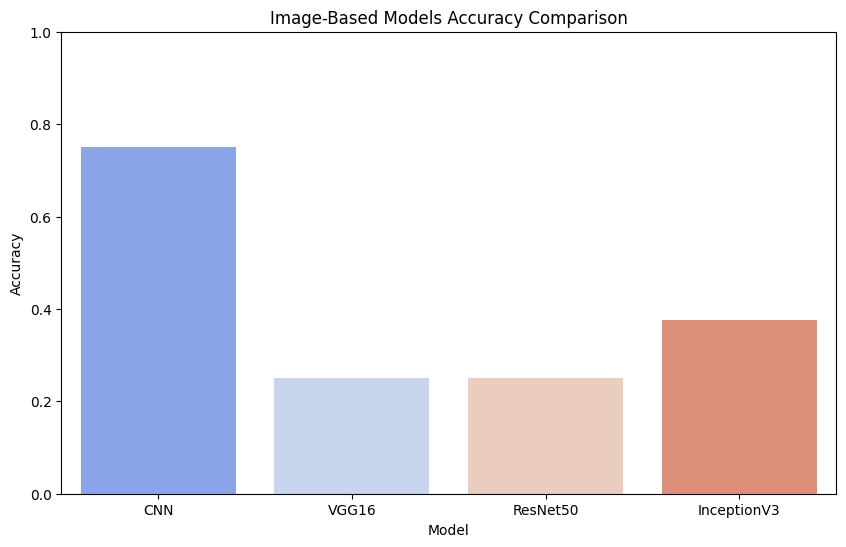

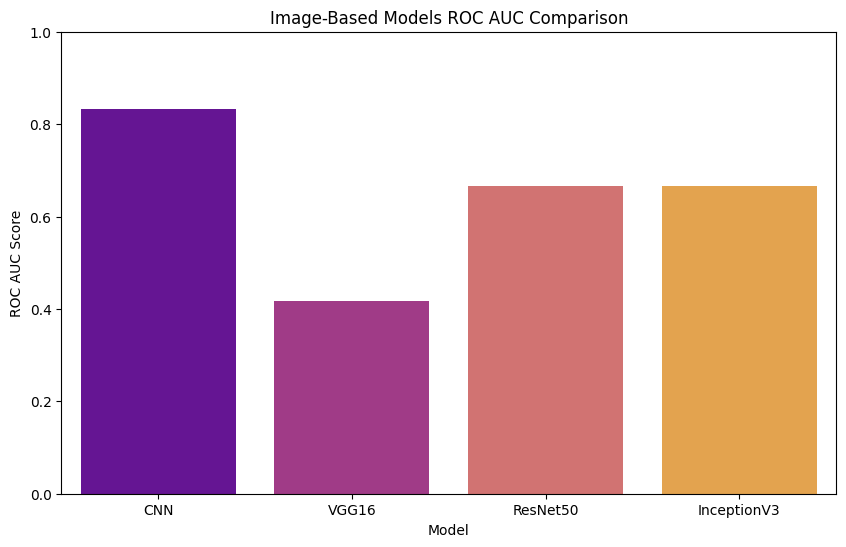

In [ ]:
# Plot Accuracy Comparison
plt.figure(figsize=(10,6))
sns.barplot(x='Model', y='Accuracy', data=image_metrics, palette='coolwarm')
plt.title('Image-Based Models Accuracy Comparison')
plt.ylabel('Accuracy')
plt.ylim(0,1)
plt.show()

# Plot ROC AUC Comparison
plt.figure(figsize=(10,6))
sns.barplot(x='Model', y='ROC AUC', data=image_metrics, palette='plasma')
plt.title('Image-Based Models ROC AUC Comparison')
plt.ylabel('ROC AUC Score')
plt.ylim(0,1)
plt.show()


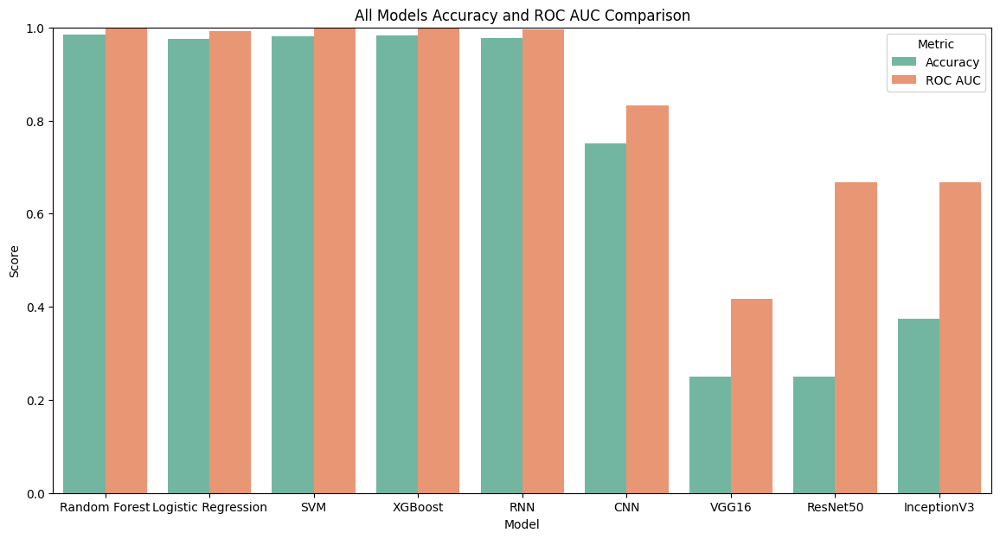

In [ ]:
# Combined Metrics for All Models
combined_metrics = pd.concat([
    sequence_metrics.assign(Model_Type='Sequence-Based'),
    image_metrics.assign(Model_Type='Image-Based')
], ignore_index=True)

# Melt the DataFrame for easier plotting
combined_metrics_melted = combined_metrics.melt(id_vars=['Model', 'Model_Type'],
                                               value_vars=['Accuracy', 'ROC AUC'],
                                               var_name='Metric',
                                               value_name='Score')

# Plot Combined Comparison
plt.figure(figsize=(14,7))
sns.barplot(x='Model', y='Score', hue='Metric', data=combined_metrics_melted, palette='Set2')
plt.title('All Models Accuracy and ROC AUC Comparison')
plt.ylabel('Score')
plt.ylim(0,1)
plt.legend(title='Metric')
plt.show()


In [ ]:
# Identify the best sequence-based model
best_sequence_model = sequence_metrics.loc[sequence_metrics['ROC AUC'].idxmax()]
print("Best Sequence-Based Model:")
print(best_sequence_model)

# Identify the best image-based model
best_image_model = image_metrics.loc[image_metrics['ROC AUC'].idxmax()]
print("\nBest Image-Based Model:")
print(best_image_model)

# Compare the best models from both categories
if best_sequence_model['ROC AUC'] > best_image_model['ROC AUC']:
    print(f"\nOverall Best Model: {best_sequence_model['Model']} (Sequence-Based) with ROC AUC = {best_sequence_model['ROC AUC']:.4f}")
else:
    print(f"\nOverall Best Model: {best_image_model['Model']} (Image-Based) with ROC AUC = {best_image_model['ROC AUC']:.4f}")


Best Sequence-Based Model:
Model        XGBoost
Accuracy    0.983684
ROC AUC     0.998027
Name: 3, dtype: object

Best Image-Based Model:
Model            CNN
Accuracy        0.75
ROC AUC     0.833333
Name: 0, dtype: object

Overall Best Model: XGBoost (Sequence-Based) with ROC AUC = 0.9980


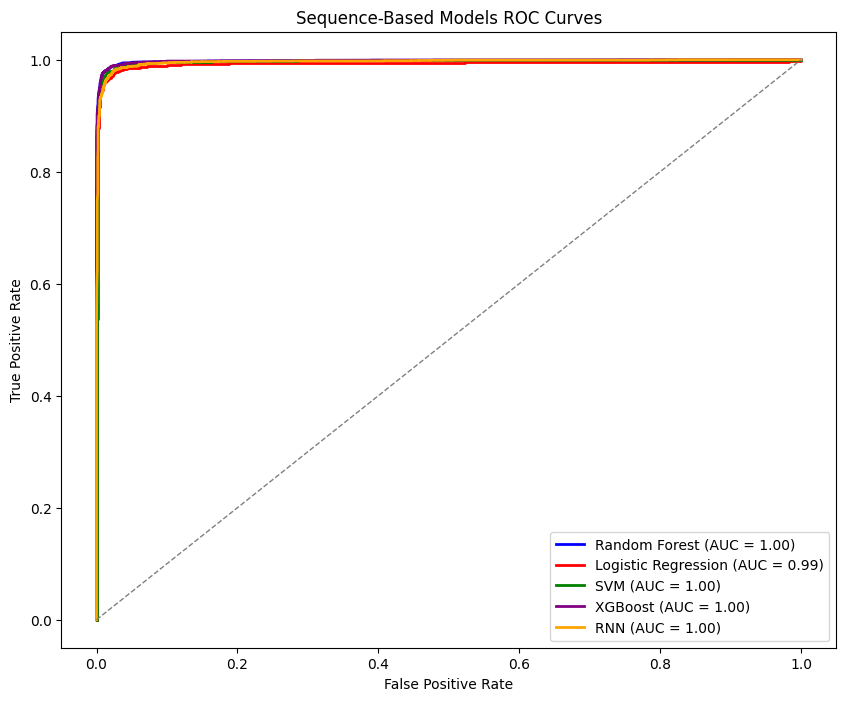

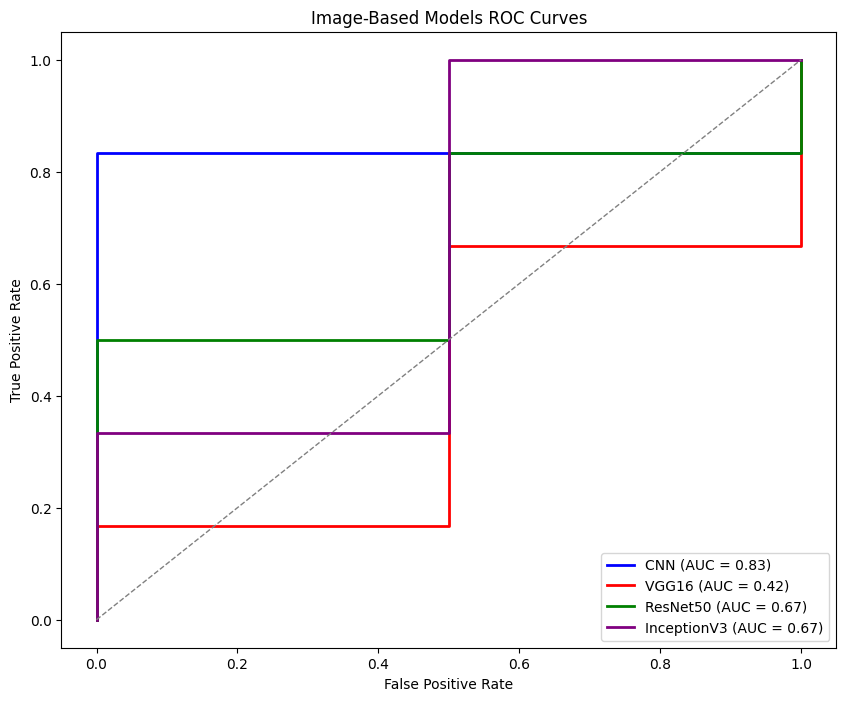

In [ ]:
from sklearn.metrics import roc_curve, auc

# Function to plot ROC curve
def plot_roc(y_true, y_proba, model_name, color):
    fpr, tpr, _ = roc_curve(y_true, y_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=color, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

# Plot ROC Curves for Sequence-Based Models
plt.figure(figsize=(10,8))
plot_roc(y_test_seq, y_pred_seq_proba, 'Random Forest', 'blue')
plot_roc(y_test_seq, y_pred_lr_proba, 'Logistic Regression', 'red')
plot_roc(y_test_seq, y_pred_svm_proba, 'SVM', 'green')
plot_roc(y_test_seq, y_pred_xgb_proba, 'XGBoost', 'purple')
plot_roc(y_test_seq, y_pred_rnn_proba, 'RNN', 'orange')
plt.plot([0,1], [0,1], color='grey', lw=1, linestyle='--')
plt.title('Sequence-Based Models ROC Curves')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.show()

# Plot ROC Curves for Image-Based Models
plt.figure(figsize=(10,8))
plot_roc(y_test_img, y_pred_img_proba, 'CNN', 'blue')
plot_roc(y_test_img, y_pred_vgg16, 'VGG16', 'red')
plot_roc(y_test_img, y_pred_resnet50, 'ResNet50', 'green')
plot_roc(y_test_img, y_pred_inceptionv3, 'InceptionV3', 'purple')
plt.plot([0,1], [0,1], color='grey', lw=1, linestyle='--')
plt.title('Image-Based Models ROC Curves')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.show()


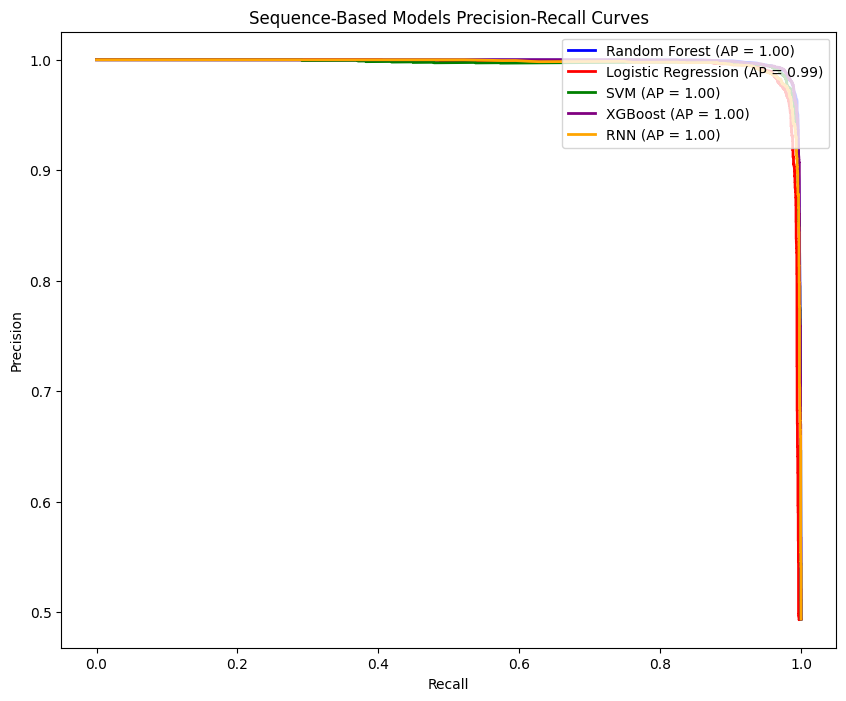

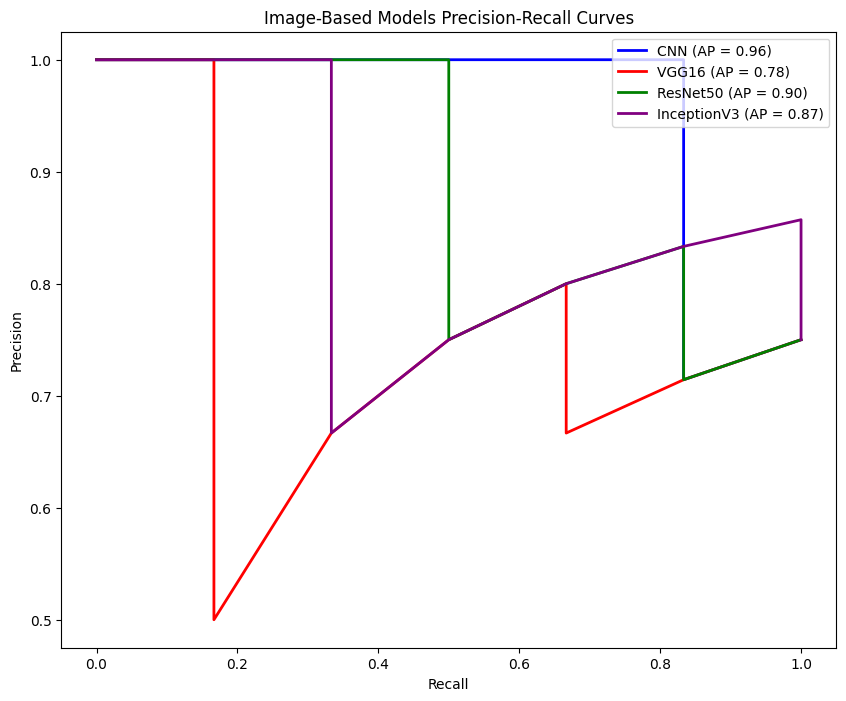

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Function to plot Precision-Recall curve
def plot_precision_recall(y_true, y_proba, model_name, color):
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    average_precision = average_precision_score(y_true, y_proba)
    plt.plot(recall, precision, color=color, lw=2, label=f'{model_name} (AP = {average_precision:.2f})')

# Plot Precision-Recall Curves for Sequence-Based Models
plt.figure(figsize=(10,8))
plot_precision_recall(y_test_seq, y_pred_seq_proba, 'Random Forest', 'blue')
plot_precision_recall(y_test_seq, y_pred_lr_proba, 'Logistic Regression', 'red')
plot_precision_recall(y_test_seq, y_pred_svm_proba, 'SVM', 'green')
plot_precision_recall(y_test_seq, y_pred_xgb_proba, 'XGBoost', 'purple')
plot_precision_recall(y_test_seq, y_pred_rnn_proba, 'RNN', 'orange')
plt.title('Sequence-Based Models Precision-Recall Curves')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc='upper right')
plt.show()

# Plot Precision-Recall Curves for Image-Based Models
plt.figure(figsize=(10,8))
plot_precision_recall(y_test_img, y_pred_img_proba, 'CNN', 'blue')
plot_precision_recall(y_test_img, y_pred_vgg16, 'VGG16', 'red')
plot_precision_recall(y_test_img, y_pred_resnet50, 'ResNet50', 'green')
plot_precision_recall(y_test_img, y_pred_inceptionv3, 'InceptionV3', 'purple')
plt.title('Image-Based Models Precision-Recall Curves')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc='upper right')
plt.show()


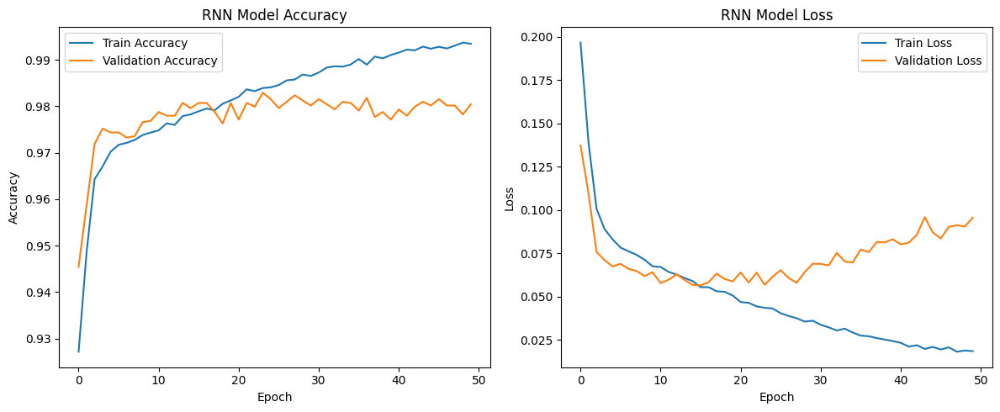

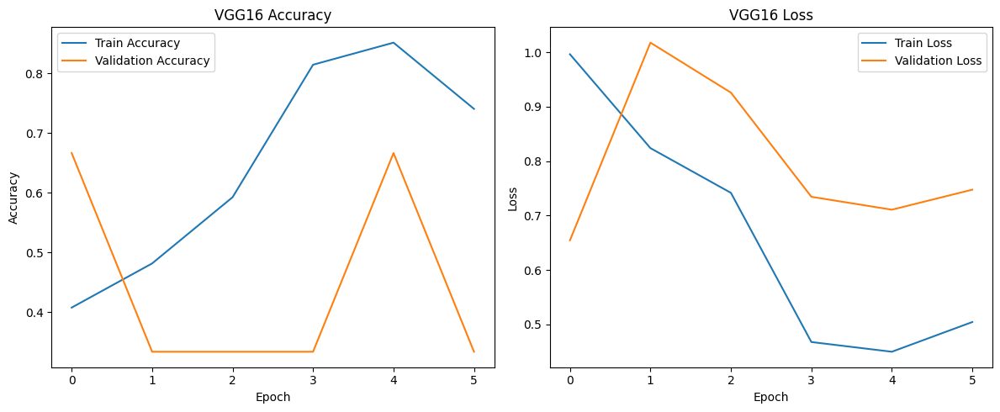

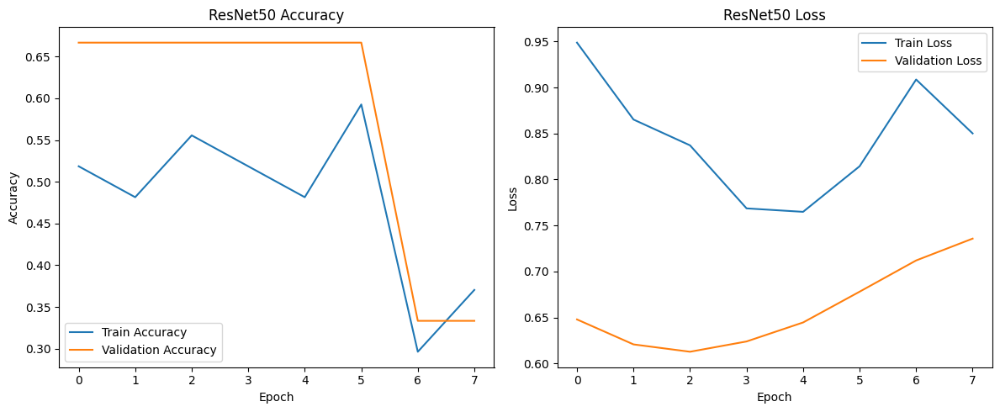

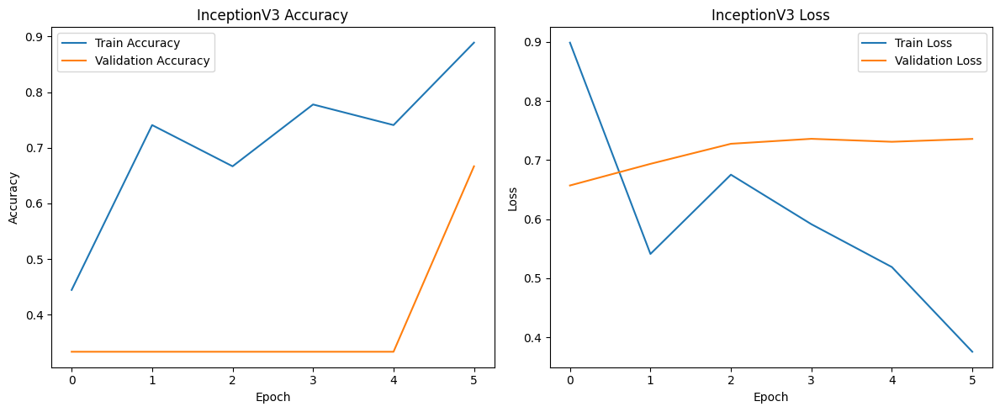

In [ ]:
# Plot RNN Training History
plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history_rnn.history['accuracy'], label='Train Accuracy')
plt.plot(history_rnn.history['val_accuracy'], label='Validation Accuracy')
plt.title('RNN Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss
plt.subplot(1,2,2)
plt.plot(history_rnn.history['loss'], label='Train Loss')
plt.plot(history_rnn.history['val_loss'], label='Validation Loss')
plt.title('RNN Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Plot Transfer Learning Models Training History
def plot_training_history(history, model_name):
    plt.figure(figsize=(12,5))

    # Accuracy
    plt.subplot(1,2,1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1,2,2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot for VGG16
plot_training_history(history_vgg16, 'VGG16')

# Plot for ResNet50
plot_training_history(history_resnet50, 'ResNet50')

# Plot for InceptionV3
plot_training_history(history_inceptionv3, 'InceptionV3')


#Hyper Parameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, confusion_matrix
import joblib
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
# Define the parameter grid for Random Forest
param_grid = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}


In [ ]:
# Initialize Random Forest
rf = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    n_jobs=-1,  # Utilize all available cores
    verbose=2,
    scoring='roc_auc'  # Optimize for ROC AUC
)

# Fit GridSearchCV to the training data
grid_search.fit(X_train_seq_scaled, y_train_seq)


Fitting 5 folds for each of 540 candidates, totalling 2700 fits
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  17.5s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  33.3s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  33.0s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=  50.3s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time= 1.1min
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time= 1.4min
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  17.4s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100; tot

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'max_depth': [None, 10, 20, 30, 40, 50],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300, 400, 500]},
             scoring='roc_auc', verbose=2)

In [ ]:
# Best parameters found by GridSearchCV
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Best estimator
best_rf = grid_search.best_estimator_


Best Parameters: {'bootstrap': False, 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 400}


In [ ]:
# Predictions with the tuned model
y_pred_tuned_rf = best_rf.predict(X_test_seq_scaled)
y_pred_tuned_rf_proba = best_rf.predict_proba(X_test_seq_scaled)[:, 1]

# Evaluate the tuned model
accuracy_tuned_rf = accuracy_score(y_test_seq, y_pred_tuned_rf)
roc_auc_tuned_rf = roc_auc_score(y_test_seq, y_pred_tuned_rf_proba)
conf_matrix_tuned_rf = confusion_matrix(y_test_seq, y_pred_tuned_rf)

print("Tuned Random Forest Model Accuracy:", accuracy_tuned_rf)
print("Tuned Random Forest Model ROC AUC:", roc_auc_tuned_rf)
print("Tuned Random Forest Model Confusion Matrix:\n", conf_matrix_tuned_rf)
print("Tuned Random Forest Classification Report:")
print(classification_report(y_test_seq, y_pred_tuned_rf))


Tuned Random Forest Model Accuracy: 0.984235475691765
Tuned Random Forest Model ROC AUC: 0.9980762674517475
Tuned Random Forest Model Confusion Matrix:
 [[4532   60]
 [  83 4396]]
Tuned Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4592
           1       0.99      0.98      0.98      4479

    accuracy                           0.98      9071
   macro avg       0.98      0.98      0.98      9071
weighted avg       0.98      0.98      0.98      9071



<Figure size 800x600 with 0 Axes>

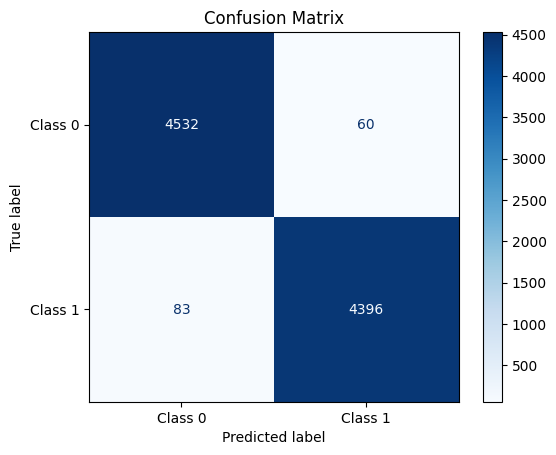

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_seq, y_pred_tuned_rf)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Class 0', 'Class 1'])

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix")
plt.show()

In [ ]:
performance_comparison = pd.DataFrame({
    'Model': ['Original Random Forest', 'Tuned Random Forest'],
    'Accuracy': [accuracy_score(y_test_seq, y_pred_seq), accuracy_tuned_rf],
    'ROC AUC': [roc_auc_score(y_test_seq, rf_model.predict_proba(X_test_seq_scaled)[:, 1]), roc_auc_tuned_rf]
})

print(performance_comparison)


                    Model  Accuracy   ROC AUC
0  Original Random Forest  0.983905  0.997854
1     Tuned Random Forest  0.984235  0.998076


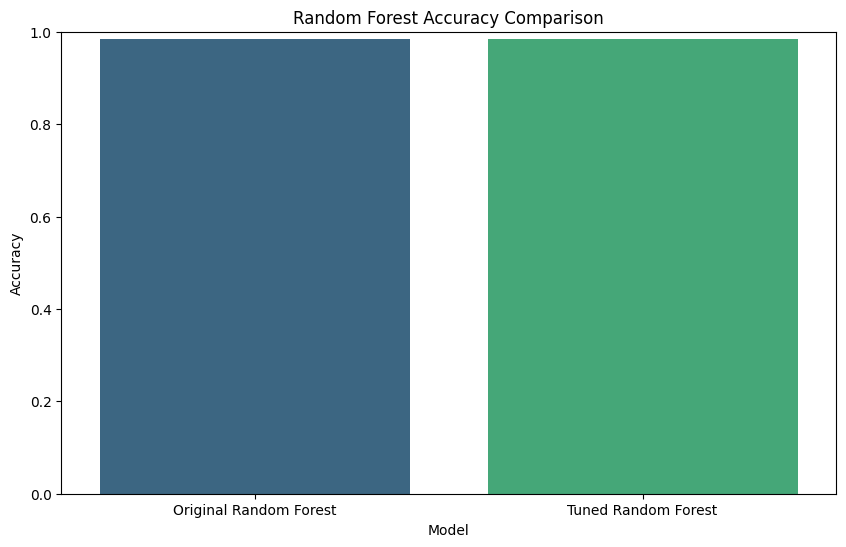

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Model', y='Accuracy', data=performance_comparison, palette='viridis')
plt.title('Random Forest Accuracy Comparison')
plt.ylim(0, 1)
plt.show()


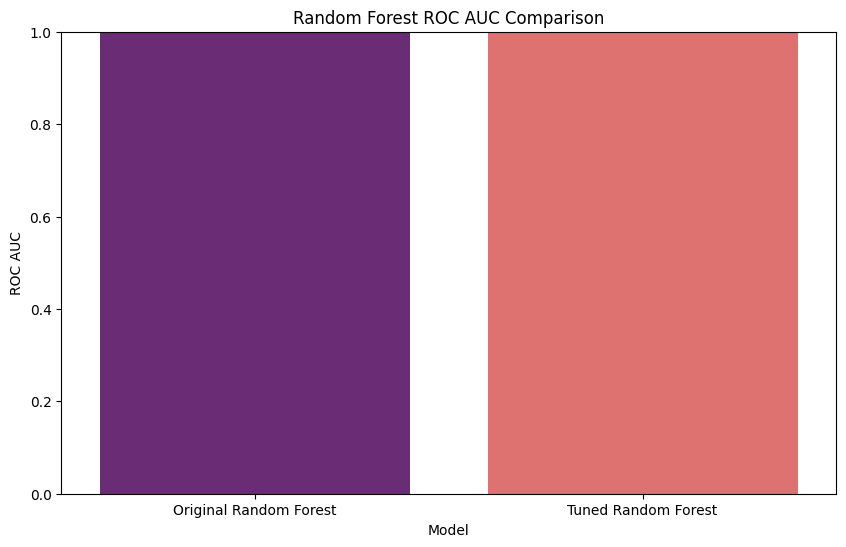

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Model', y='ROC AUC', data=performance_comparison, palette='magma')
plt.title('Random Forest ROC AUC Comparison')
plt.ylim(0, 1)
plt.show()

#XAI For Sequence Model

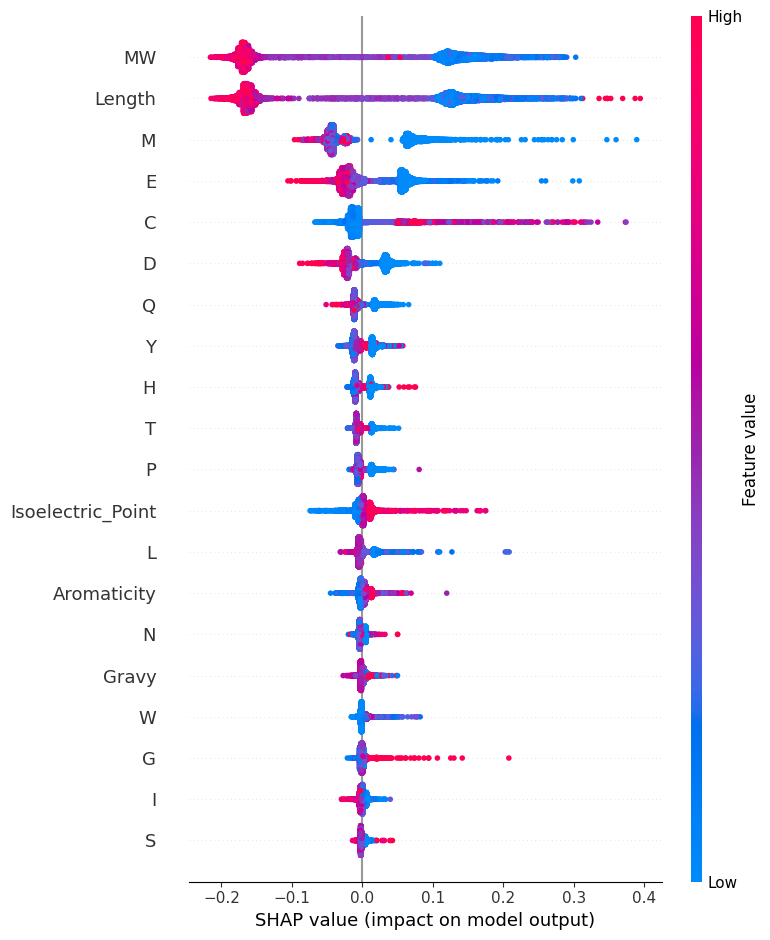

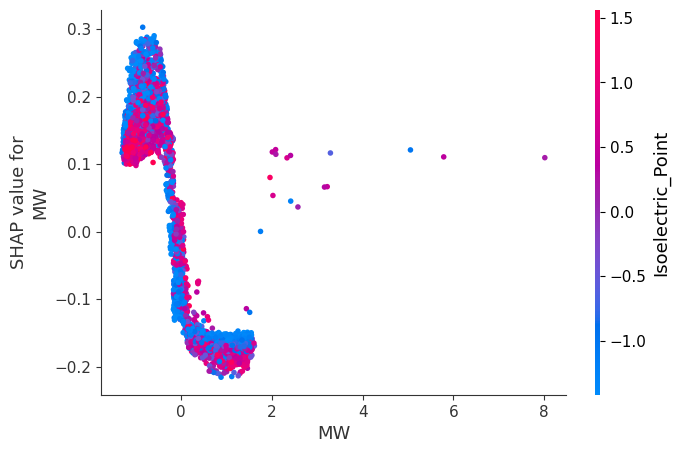

In [ ]:
import shap

# Create SHAP explainer
explainer = shap.TreeExplainer(best_rf)
shap_values = explainer.shap_values(X_test_seq_scaled)

# Summary plot for SHAP values
shap.summary_plot(shap_values[1], X_test_seq_scaled, feature_names=X_seq.columns)

# SHAP dependence plot for an important feature
shap.dependence_plot('MW', shap_values[1], X_test_seq_scaled, feature_names=X_seq.columns)


In [ ]:
feature_names=X_seq.columns

In [ ]:
from lime import lime_tabular

# Convert training data to numpy array
X_train_seq_np = X_train_seq.values
X_test_seq_np = X_test_seq.values
# Ensure feature_names is a list
feature_names = X_seq.columns.tolist()

# Initialize Lime explainer
lime_explainer = lime_tabular.LimeTabularExplainer(
    X_train_seq_np,
    feature_names=feature_names,
    class_names=['Negative', 'Positive'],
    mode='classification'
)

# Explain a single prediction
idx = 0
lime_exp = lime_explainer.explain_instance(
    X_test_seq_np[idx],
    tuned_rf_model.predict_proba,
    num_features=10
)

# Display the explanation
lime_exp.show_in_notebook()


In [ ]:
for i in range(5):  # First 5 instances in the test set
    lime_exp = lime_explainer.explain_instance(
        X_test_seq_np[i],
        tuned_rf_model.predict_proba,
        num_features=10
    )
    lime_exp.show_in_notebook()


#saving the model

In [ ]:
# Save the tuned Random Forest model
joblib.dump(rf_model, '/kaggle/working/tuned_random_forest.pkl')


['/kaggle/working/tuned_random_forest.pkl']

In [ ]:
# Save the CNN model
cnn_model.save('/kaggle/working/cnn_model.h5')


In [ ]:
# After fitting the scaler
scaler = StandardScaler()
X_train_seq_scaled = scaler.fit_transform(X_train_seq)

# Save the scaler
joblib.dump(scaler, '/kaggle/working/scaler.pkl')


['/kaggle/working/scaler.pkl']